# 1.Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


from sklearn.feature_selection import SelectKBest
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from ydata_profiling import ProfileReport
from sklearn.metrics import f1_score

#KNN IMPUTER
from sklearn.impute import KNNImputer

#CROSS VALIDATION
from sklearn.model_selection import cross_val_score, StratifiedKFold

#ENCODING
from category_encoders import TargetEncoder
from sklearn.preprocessing import LabelEncoder

#DATA NORMALIZATION

#MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

# Robust Scaler
from sklearn.preprocessing import RobustScaler

#FEATURE SELECTION

#Filter Methods
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import mutual_info_classif

#Wrapper Methods
from sklearn.feature_selection import RFE

#Embedded Methods 
from sklearn.linear_model import LassoCV

#MODELS

#LogisticRegression
from sklearn.linear_model import LogisticRegression

#Naive Bayes 

from sklearn.naive_bayes import GaussianNB

#KNN Classifier
from sklearn.neighbors import KNeighborsClassifier

#MLP Classifier
from sklearn.neural_network import MLPClassifier

#Decision Trees
from sklearn.tree import DecisionTreeClassifier

#ENSEMBLE

#Random Forest
from sklearn.ensemble import RandomForestClassifier

#BaggingClassifier
from sklearn.ensemble import BaggingClassifier

#Boosting
from sklearn.ensemble import GradientBoostingClassifier

#AdaBoost
from sklearn.ensemble import AdaBoostClassifier

#Stacking
from sklearn.ensemble import StackingClassifier

#Voting
from sklearn.ensemble import VotingClassifier

from scipy import stats

from math import ceil


from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import StratifiedKFold
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
import time

#install mlxtend
#!pip install mlxtend

#import warnings
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve


**1.1 Import train and test data set**

In [2]:
df = pd.read_csv(r"C:\Users\carla\OneDrive\Ambiente de Trabalho\ML PROJECT 23\project_data\train.csv")
test = pd.read_csv(r"C:\Users\carla\OneDrive\Ambiente de Trabalho\ML PROJECT 23\project_data\test.csv")
df

,encounter_id,country,patient_id,race,gender,age,weight,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,...,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_binary,readmitted_multiclass
0,533253,USA,70110,Caucasian,Female,[70-80),?,?,0,0,...,276,466,8,NaN,NaN,No,No,[],No,>30 days
1,426224,USA,29775006,AfricanAmerican,Male,[50-60),?,?,0,0,...,785,162,9,NaN,NaN,No,Yes,['insulin'],No,No
2,634063,USA,80729253,Caucasian,Female,[60-70),?,?,0,0,...,135,250,6,NaN,NaN,Ch,Yes,"['glimepiride', 'insulin']",No,No
3,890610,USA,2919042,AfricanAmerican,Male,[60-70),?,MC,0,0,...,562,455,5,NaN,NaN,No,No,[],No,No
4,654194,USA,84871971,Caucasian,Female,[70-80),?,HM,1,0,...,599,428,9,NaN,NaN,No,No,[],No,>30 days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71231,660160,USA,24531381,AfricanAmerican,Female,[80-90),?,MC,0,1,...,786,250,9,NaN,>7,Ch,Yes,"['metformin', 'glyburide', 'insulin']",No,No
71232,826429,USA,4663818,AfricanAmerican,Female,[70-80),?,?,0,0,...,197,V66,6,NaN,>7,Ch,Yes,"['metformin', 'glyburide']",No,No
71233,332030,USA,23397147,Caucasian,Female,[60-70),?,?,0,2,...,491,276,9,>300,NaN,Ch,Yes,"['glyburide', 'insulin']",Yes,<30 days
71234,757560,USA,52161750,Caucasian,Male,[60-70),?,BC,0,0,...,157,250.8,5,NaN,NaN,Ch,Yes,"['glyburide', 'insulin']",No,No


**Lab4**

**_Note_**: You should not use any information from the validation / test dataset to fill the missing values. 
Let's imagine that you have missing values on age and you want to fill those missing values with the median. You should compute the median value of age for the train dataset (suppose is 35) and fill the missing values in train, validation and test set (if available) with the median in the train dataset (35).

## 1.1 Train Test Split

In [3]:
# Define your target variable and features
X = df.drop(columns = ['readmitted_binary', 'readmitted_multiclass'], axis=1)  # Features
y = df['readmitted_binary']  # Target variable
#z = df['readmitted_multiclass']

# Split the train data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, 
                                                  y, 
                                                  test_size=0.2, 
                                                  random_state=42)

#X_train, X_val, y_train1, y_val1 = train_test_split(X, 
                                                  #z, 
                                                  #test_size=0.2, 
                                                  #random_state=42)



## 1.2 Metadata

- *encounter_id* - Unique identifier of the encounter (ID visita) (numerical) (Set as index)

- *country* - country (Categorical)

- *patient_id* - Identifier of the patient (ID paciente)

- *race* - Patient’s race

- *gender* - Patient’s gender (Feature Engineering: Change to 1 and 0. It would be useful in future because gender seems to be an important feature to observ

- *age* - Patient’s age bracket (Problem: is type object)

- *weight* - Patient’s weight (Peso) (Problem: is type object)

- *payer_code* - Code of the health insurance provider (if there is one)
#Check missing-values
Check all dtypes

- *outpatient_visits_in_previous_year* - Number of outpatient visits (visits made with the intention of leaving on the same day) the patient made to the hospital in the year preceding the encounter
(Visitas diárias no mesmo ano: Consultas, Emergências?

- *emergency_visits_in_previous_year* - Number of emergency visits the patient made to the hospital in the year preceding the encounter

- *inpatient_visits_in_previous_year* - Number of inpatient visits (visits with the intention to stay overnight) the patient made to the hospital in the year preceding the encounter
(Visitas com intenção de ficar?)

- *admission_type* - Type of admission of the patient (e.g. Emergency, Urgent,etc…)
(Ver todos os admission types)

- *medical_specialty* - Medical specialty on which the patient was admitted
Ver as que existem

- *average_pulse_bpm* - Average pulse of the patient during their stay in the hospital in beats per minute

- *discharge_disposition* - Destination given to the patient after being discharged
(Destino após a alta?) Checkar os que há
Pode ter sido: casa, centro de reabilitação, lar, falecido

- *admission-source* - Source of the patient before being admitted in the current encounter
(Origem do paciente) Checkar o que há 
Emergência?
Clinica? Outro hospital?

- *length_of_stay_in_hospital* - Number of days between admission and discharge

- *number_lab_tests* - Number of lab tests performed during the encounter

- *non_lab_procedures* - Number of non-lab procedures performed during the encounter

- *number_of_medications* - Number of distinct types of medication administered during the encounter

- *primary_diagnosis* - Primary diagnosis (coded as first three digits of ICD9)
Ver os códigos que existem
- *secondary_diagnosis* - Secondary diagnosis (first three digits of ICD9)
Ver os códigos que existem
- *additional_diagnosis* - Additional secondary diagnosis (first three digits of ICD9)

- *number_diagnoses* - Number of diagnoses entered to the system

- *glucose_test_result* - Range of the glucose test results or if the test was not taken. Values: “>200,” “>300,” “normal,” and “none” if not measured
Feature Engineering?

- *a1c_test_result* - Range of the A1C test results or if the test was not taken.Values: “>8” if greater than 8%, “>7” if greater than 7% but less than 8%, “normal” if less than 7%, and “none” if not measured.
Feature Engineering?

- *change_in_meds_during_hospitalization* - Indicates if there was a change in diabetic medications (dosage or generic name). Values: “change” and “no change”
prescribed_diabetes_meds - Yes if patient has diabetes medication prescribed. No otherwise.
Verificar se está em boolean?

- *medication* - List containing all generic names for the medications prescribed to the patient during the encounter. Empty list if no medication was prescribed.
Ver todos os que existem

**Targets**
- *readmitted_binary* - Binary target: Yes if patient was readmitted in less than 30 days, No otherwise.

- *readmitted_multiclass* - Multiclass target: “<30 days” if the patient was readmitted in less than 30 days after discharge. “>30 days if the patient was readmitted to the hospital but only after more than 30 days after the current discharge. No otherwise.

# 2.Data Exploration

## 2.1 Checking dataset and dtypes

In [4]:
df.info() #71236 entries and 31 variables 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           71236 non-null  int64 
 1   country                                71236 non-null  object
 2   patient_id                             71236 non-null  int64 
 3   race                                   67682 non-null  object
 4   gender                                 71236 non-null  object
 5   age                                    67679 non-null  object
 6   weight                                 71236 non-null  object
 7   payer_code                             71236 non-null  object
 8   outpatient_visits_in_previous_year     71236 non-null  int64 
 9   emergency_visits_in_previous_year      71236 non-null  int64 
 10  inpatient_visits_in_previous_year      71236 non-null  int64 
 11  admission_type 

## 2.2 Checking missing values

In [5]:
#Check for missing values on train set
print(X_train.isna().sum())


encounter_id                                 0
country                                      0
patient_id                                   0
race                                      2805
gender                                       0
age                                       2827
weight                                       0
payer_code                                   0
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                            2966
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                     2078
admission_source                          3769
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                            0
secondary_dia

In [6]:
#Check for missing values on val set
print(X_val.isna().sum())

encounter_id                                 0
country                                      0
patient_id                                   0
race                                       749
gender                                       0
age                                        730
weight                                       0
payer_code                                   0
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                             740
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                      512
admission_source                           949
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                            0
secondary_dia

## 2.3 Descriptive Statistics

In [7]:
#See description of train data
X_train.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
encounter_id,56988.0,NaN,NaN,NaN,548710.125219,259893.814793,100000.0,322854.25,547261.5,774720.5,999980.0
country,56988,1,USA,56988,NaN,NaN,NaN,NaN,NaN,NaN,NaN
patient_id,56988.0,NaN,NaN,NaN,54394273.120604,38817247.097834,135.0,23398488.0,45441346.5,87726521.25,189502619.0
race,54183,6,Caucasian,40524,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,56988,3,Female,30601,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,54161,10,[70-80),13906,NaN,NaN,NaN,NaN,NaN,NaN,NaN
weight,56988,10,?,55165,NaN,NaN,NaN,NaN,NaN,NaN,NaN
payer_code,56988,18,?,22529,NaN,NaN,NaN,NaN,NaN,NaN,NaN
outpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.368464,1.28641,0.0,0.0,0.0,0.0,42.0
emergency_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.19483,0.888386,0.0,0.0,0.0,0.0,76.0


In [8]:
# replace "" by nans
X_train.replace("", np.nan, inplace=True)
X_val.replace("", np.nan, inplace=True)
test.replace("", np.nan, inplace=True)                                      

In [9]:
#See data on non lab procedures
X_train['non_lab_procedures'].value_counts()

non_lab_procedures
0    26036
1    11661
2     7148
3     5289
6     2783
4     2363
5     1708
Name: count, dtype: int64

## 2.4 Checking % of ?

In [10]:
#Check the % of values in each feature that are equal to ?
#Train
print("Porcentagens no Conjunto de Treino:")
print("Race:", (len(X_train.loc[X_train['race'] == '?']) / len(X_train)) * 100)
print("Weight:", (len(X_train.loc[X_train['weight'] == '?']) / len(X_train)) * 100)
print("Payer Code:", (len(X_train.loc[X_train['payer_code'] == '?']) / len(X_train)) * 100)
print("Medical Specialty:", (len(X_train.loc[X_train['medical_specialty'] == '?']) / len(X_train)) * 100)
print("Primary Diagnosis:", (len(X_train.loc[X_train['primary_diagnosis'] == '?']) / len(X_train)) * 100)
print("Secondary Diagnosis:", (len(X_train.loc[X_train['secondary_diagnosis'] == '?']) / len(X_train)) * 100)
print("Additional Diagnosis:", (len(X_train.loc[X_train['additional_diagnosis'] == '?']) / len(X_train)) * 100)

# VAl
print("\nPorcentagens no Conjunto de Validação:")
print("Race:", (len(X_val.loc[X_val['race'] == '?']) / len(X_val)) * 100)
print("Weight:", (len(X_val.loc[X_val['weight'] == '?']) / len(X_val)) * 100)
print("Payer Code:", (len(X_val.loc[X_val['payer_code'] == '?']) / len(X_val)) * 100)
print("Medical Specialty:", (len(X_val.loc[X_val['medical_specialty'] == '?']) / len(X_val)) * 100)
print("Primary Diagnosis:", (len(X_val.loc[X_val['primary_diagnosis'] == '?']) / len(X_val)) * 100)
print("Secondary Diagnosis:", (len(X_val.loc[X_val['secondary_diagnosis'] == '?']) / len(X_val)) * 100)
print("Additional Diagnosis:", (len(X_val.loc[X_val['additional_diagnosis'] == '?']) / len(X_val)) * 100)


Porcentagens no Conjunto de Treino:
Race: 2.147820593809223
Weight: 96.80108092931845
Payer Code: 39.53288411595424
Medical Specialty: 49.10682950796659
Primary Diagnosis: 0.02456657541938654
Secondary Diagnosis: 0.3684986312907981
Additional Diagnosis: 1.4266161297115183

Porcentagens no Conjunto de Validação:
Race: 2.0494104435710274
Weight: 97.03116226838856
Payer Code: 39.809096013475575
Medical Specialty: 48.68753509264458
Primary Diagnosis: 0.014037057832678272
Secondary Diagnosis: 0.36496350364963503
Additional Diagnosis: 1.3686131386861315


## 2.5 Checking for duplicated values

In [11]:
print(X_train.duplicated().sum())
print(X_val.duplicated().sum())

0
0


## 2.6 Checking if we have readmitted patients

In [12]:
# Unique patient_id values in the training and validation sets
train_patient_ids = X_train['patient_id'].unique()
val_patient_ids = X_val['patient_id'].unique()
test_patient_ids = test['patient_id'].unique()
# Initialize counters for the training set
count_age_train = 0
count_admission_type_train = 0
count_discharge_disposition_train = 0
count_admission_source_train = 0

# Iterates in the training set checking if the patient has been readmitted and has values that are nan and that are not.
for i in train_patient_ids:
    if len(X_train[X_train['patient_id'] == i]) > 1:
        dff = X_train[X_train['patient_id'] == i]
        if dff['age'].isnull().values.any():
            count_age_train += dff['age'].isnull().sum()
        if dff['admission_type'].isnull().values.any():
            count_admission_type_train += dff['admission_type'].isnull().sum()
        if dff['discharge_disposition'].isnull().values.any():
            count_discharge_disposition_train += dff['discharge_disposition'].isnull().sum()
        if dff['admission_source'].isnull().values.any():
            count_admission_source_train += dff['admission_source'].isnull().sum()

# Initialize counters for the validation set
count_age_val = 0
count_admission_type_val = 0
count_discharge_disposition_val = 0
count_admission_source_val = 0

# Iterates in the val set checking if the patient has been readmitted and has values that are nan and that are not.
for i in val_patient_ids:
    if len(X_val[X_val['patient_id'] == i]) > 1:
        dff = X_val[X_val['patient_id'] == i]
        if dff['age'].isnull().values.any():
            count_age_val += dff['age'].isnull().sum()
        if dff['admission_type'].isnull().values.any():
            count_admission_type_val += dff['admission_type'].isnull().sum()
        if dff['discharge_disposition'].isnull().values.any():
            count_discharge_disposition_val += dff['discharge_disposition'].isnull().sum()
        if dff['admission_source'].isnull().values.any():
            count_admission_source_val += dff['admission_source'].isnull().sum()

# Print results for both sets
print("Training Set:")
print(count_admission_source_train, count_admission_type_train, count_age_train, count_discharge_disposition_train)

print("\nValidation Set:")
print(count_admission_source_val, count_admission_type_val, count_age_val, count_discharge_disposition_val)


Training Set:
1219 568 947 780

Validation Set:
116 57 105 76


In [13]:
print(X_train.isna().sum())
\
print(X_val.isna().sum())

encounter_id                                 0
country                                      0
patient_id                                   0
race                                      2805
gender                                       0
age                                       2827
weight                                       0
payer_code                                   0
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                            2966
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                     2078
admission_source                          3769
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                            0
secondary_dia

In [14]:
#Copy to a new variable 1
X_train1 = X_train.copy()
X_val1 = X_val.copy()
test1 = test.copy()


# 3.Data Pre-Processing

## 3.1 Initial Drops

In [15]:
# WE REMOVE VARIABLES THAT DO NOT INTEREST US
# WE WERE ABLE TO VERIFY THAT THERE ARE AN EXCESSIVE NUMBER OF "?" (40% TO 96%) IN THE VARIABLES: weight, payer_code 
# LET'S THEREFORE DELETE THESE COLUMNS
X_train1 = X_train1.drop(['country', 'weight', 'payer_code' ], axis=1)
X_val1 = X_val1.drop(['country', 'weight', 'payer_code'], axis=1)
test1 = test1.drop(['country', 'weight', 'payer_code'], axis=1)

X_train1.head()


,encounter_id,patient_id,race,gender,age,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,...,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication
43545,613653,85248135,Caucasian,Female,[50-60),0,0,2,Urgent,?,...,16,250.6,682,707,9,NaN,NaN,Ch,Yes,"['rosiglitazone', 'insulin']"
30779,508846,97887789,Caucasian,Male,[80-90),0,0,0,Elective,?,...,28,812,428,E880,9,NaN,NaN,No,Yes,['pioglitazone']
64909,615897,3677022,Caucasian,Female,[20-30),0,0,2,Urgent,ObstetricsandGynecology,...,3,648,250.03,785,5,NaN,NaN,No,Yes,['insulin']
30302,234535,137342687,Caucasian,Female,[70-80),0,0,0,Emergency,?,...,13,435,401,250,5,NaN,NaN,Ch,Yes,['insulin']
53951,672329,42027282,Caucasian,Female,[70-80),1,0,2,Emergency,?,...,12,805,427,428,9,NaN,NaN,Ch,Yes,"['pioglitazone', 'glyburide-metformin']"


## 3.2 Replace 'Unknown/Invalid' in 'gender' with the mode

In [16]:
# Replace 'Unknown/Invalid' in 'gender' with the mode value
mode_gender_train = X_train1['gender'].mode()[0]
value_to_replace = 'Unknown/Invalid'
X_train1.loc[X_train1['gender'] == value_to_replace, 'gender'] = mode_gender_train
X_val1.loc[X_val1['gender'] == value_to_replace, 'gender'] = mode_gender_train
test1.loc[test1['gender'] == value_to_replace, 'gender'] =  mode_gender_train

In [17]:
X_train1.isna().sum()

encounter_id                                 0
patient_id                                   0
race                                      2805
gender                                       0
age                                       2827
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                            2966
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                     2078
admission_source                          3769
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                            0
secondary_diagnosis                          0
additional_diagnosis                         0
number_diagnoses                             0
glucose_test_

In [18]:
X_train2 = X_train1.copy()
X_val2 = X_val1.copy()
test2 = test1.copy()

## 3.3 Replace nan values in readmitedd pacients with value of last visit

In [19]:
#This means that we have some patients that were admitted more than once. 
#It is most likely that the admission_source and admission_type 
#is the same as well with age as its a range of 10 years and discharge disposition. 
#So instead of mode for some we add the ones that have value already.
#The following is not the best code but it works :')

# Resetar índices dos conjuntos de treino e validação
X_train2 = X_train2.reset_index(drop=True)
X_val2 = X_val2.reset_index(drop=True)
test2 = test2.reset_index(drop=True)

nan_values = ['age', 'race', 'admission_type', 'discharge_disposition', 'admission_source']

# Iterate over unique patient_ids in the training set
for i in train_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) > 1:
        dff = X_train2[X_train2['patient_id'] == i]
        for j in nan_values:
            if dff[j].isnull().values.any() and len(dff[j]) != dff[j].isnull().sum():
                indexes_nan = dff[dff[j].isnull()].index
                indexes = dff[dff[j].notnull()].index
                if indexes.any():
                    X_train2.loc[indexes_nan, j] = X_train2.loc[indexes[0], j]
#For validation with only the train data set
for i in val_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) >= 1:
        dff = X_train2[X_train2['patient_id'] == i]
        df_null = X_val2[X_val2['patient_id'] == i]
        for j in nan_values:
            dff2 = dff[dff[j].notnull()]
            if len(dff2)>=1 and df_null[j].isnull().sum()>=1:
                indexes_nan = df_null[df_null[j].isnull()].index
                if indexes_nan.any():
                    X_val2[j].iloc[indexes_nan] = dff2[j].values[0]
#test
for i in test_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) >= 1:
        dff = X_train2[X_train2['patient_id'] == i]
        df_null = test2[test2['patient_id'] == i]
        for j in nan_values:
            dff2 = dff[dff[j].notnull()]
            if len(dff2)>=1 and df_null[j].isnull().sum()>=1:
                indexes_nan = df_null[df_null[j].isnull()].index
                if indexes_nan.any():
                    test2[j].iloc[indexes_nan] = dff2[j].values[0]

## 3.4 Replace ? values in readmitedd pacients with value of last visit

In [20]:
#Lets try this also with the ? values and see what we find. 

values_change = ['race', 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis', 'medical_specialty']

# Training set
for i in train_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) > 1:
        dff = X_train2[X_train2['patient_id'] == i]
        for j in values_change:
            num_value = len(dff[j].loc[dff[j] == '?'])
            if num_value > 0 and len(dff[j]) != num_value:
                indexes_nan = X_train2.loc[(X_train2['patient_id'] == i) & (X_train2[j].str.contains('?', regex=False, na=False))].index
                indexes = X_train2.loc[(X_train2['patient_id'] == i) & (~X_train2[j].str.contains('?', regex=False, na=False))].index
                X_train2[j].iloc[indexes_nan] = X_train2[j].iloc[indexes[0]]

# Validation set
for i in val_patient_ids:
    if len(X_val2[X_val2['patient_id'] == i]) > 1:
        dff = X_val2[X_val2['patient_id'] == i]
        for j in values_change:
            num_value = len(dff[j].loc[dff[j] == '?'])
            if num_value > 0 and len(dff[j]) != num_value:
                indexes_nan = X_val2.loc[(X_val2['patient_id'] == i) & (X_val2[j].str.contains('?', regex=False, na=False))].index
                indexes = X_val2.loc[(X_val2['patient_id'] == i) & (~X_val2[j].str.contains('?', regex=False, na=False))].index
                X_val2[j].iloc[indexes_nan] = X_val2[j].iloc[indexes[0]]
                
for i in val_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) >= 1:
        dff = X_train2[X_train2['patient_id'] == i]
        df_null = X_val2[X_val2['patient_id'] == i]
        for j in nan_values:
            dff2 = dff[dff[j]!='?']
            
            if len(dff2)>=1 and len(df_null[j].loc[df_null[j]=='?'])>=1:
                indexes_nan = df_null.loc[df_null[j]=='?'].index
                if indexes_nan.any():
                    X_val2[j].iloc[indexes_nan] = dff2[j].values[0]
                
# test set
for i in val_patient_ids:
    if len(test2[test2['patient_id'] == i]) > 1:
        dff = test2[test2['patient_id'] == i]
        for j in values_change:
            num_value = len(dff[j].loc[dff[j] == '?'])
            if num_value > 0 and len(dff[j]) != num_value:
                indexes_nan = test2.loc[(X_val2['patient_id'] == i) & (test2[j].str.contains('?', regex=False, na=False))].index
                indexes = test2.loc[(test2['patient_id'] == i) & (~test2[j].str.contains('?', regex=False, na=False))].index
                test2[j].iloc[indexes_nan] = test2[j].iloc[indexes[0]]
                
for i in val_patient_ids:
    if len(X_train2[X_train2['patient_id'] == i]) >= 1:
        dff = X_train2[X_train2['patient_id'] == i]
        df_null = test2[test2['patient_id'] == i]
        for j in nan_values:
            dff2 = dff[dff[j]!='?']
            if len(dff2)>=1 and len(df_null[j].loc[df_null[j]=='?'])>=1:
                indexes_nan = df_null.loc[df_null[j]=='?'].index
                if indexes_nan.any():
                    test2[j].iloc[indexes_nan] = dff2[j].values[0]

In [21]:
X_train2.isna().sum()

encounter_id                                 0
patient_id                                   0
race                                      1885
gender                                       0
age                                       1900
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                            2736
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                     1645
admission_source                          3741
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                            0
secondary_diagnosis                          0
additional_diagnosis                         0
number_diagnoses                             0
glucose_test_

In [22]:
#Checking the percentage of ?
print("Percentages in the Training Set:")
print("Race:", (len(X_train2.loc[X_train2['race'] == '?']) / len(X_train2)) * 100)
print("Medical Specialty:", (len(X_train2.loc[X_train2['medical_specialty'] == '?']) / len(X_train2)) * 100)
print("Primary Diagnosis:", (len(X_train2.loc[X_train2['primary_diagnosis'] == '?']) / len(X_train2)) * 100)
print("Secondary Diagnosis:", (len(X_train2.loc[X_train2['secondary_diagnosis'] == '?']) / len(X_train2)) * 100)
print("Additional Diagnosis:", (len(X_train2.loc[X_train2['additional_diagnosis'] == '?']) / len(X_train2)) * 100)

print("\nPercentages in the Validation Set:")
print("Race:", (len(X_val2.loc[X_val2['race'] == '?']) / len(X_val2)) * 100)
print("Medical Specialty:", (len(X_val2.loc[X_val2['medical_specialty'] == '?']) / len(X_val2)) * 100)
print("Primary Diagnosis:", (len(X_val2.loc[X_val2['primary_diagnosis'] == '?']) / len(X_val2)) * 100)
print("Secondary Diagnosis:", (len(X_val2.loc[X_val2['secondary_diagnosis'] == '?']) / len(X_val2)) * 100)
print("Additional Diagnosis:", (len(X_val2.loc[X_val2['additional_diagnosis'] == '?']) / len(X_val2)) * 100)


Percentages in the Training Set:
Race: 2.0793851337123606
Medical Specialty: 45.88860812802695
Primary Diagnosis: 0.014038043096792305
Secondary Diagnosis: 0.3018179265810346
Additional Diagnosis: 1.1598933108724645

Percentages in the Validation Set:
Race: 1.9651880965749577
Medical Specialty: 47.64879281302639
Primary Diagnosis: 0.007018528916339136
Secondary Diagnosis: 0.34390791690061767
Additional Diagnosis: 1.2984278495227402



## 3.5. Replacing ? with mode on race

In [23]:
columns_to_replace = ['race']
#Changing with mode on race with training val and test data

for column in columns_to_replace:
    X_train2[column] = X_train2[column].str.strip()  
    mode_value = X_train2[column].mode()[0]  
    X_train2[column] = X_train2[column].replace('?', mode_value)

for column in columns_to_replace:
    X_val2[column] = X_val2[column].str.strip()  
    mode_value = X_val2[column].mode()[0]  
    X_val2[column] = X_val2[column].replace('?', mode_value)
    
for column in columns_to_replace:
    test2[column] = test2[column].str.strip()  
    mode_value = test2[column].mode()[0]  
    test2[column] = test2[column].replace('?', mode_value)

In [24]:
print("Race:", (len(X_train2.loc[X_train2['race'] == '?']) / len(X_train2)) * 100)
print("Race:", (len(X_val2.loc[X_val2['race'] == '?']) / len(X_val2)) * 100)

Race: 0.0
Race: 0.0


## 3.6 Replace Missing Values with the mode in race and age

In [25]:
#Fill nans with mode
for column in ['race', 'age']:
    mode_value = X_train2[column].mode()[0]
    X_train2[column].fillna(mode_value, inplace=True)
    X_val2[column].fillna(mode_value, inplace=True)
    test2[column].fillna(mode_value, inplace=True)

## 3.7 Replace Missing Values with 'Not Saved' on AT, DD, AS

In [26]:
X_train2['admission_type'].fillna('not_saved', inplace=True)
X_train2['discharge_disposition'].fillna('not_saved', inplace=True)
X_train2['admission_source'].fillna('not_saved', inplace=True)

X_val2['admission_type'].fillna('not_saved', inplace=True)
X_val2['discharge_disposition'].fillna('not_saved', inplace=True)
X_val2['admission_source'].fillna('not_saved', inplace=True)


test2['admission_type'].fillna('not_saved', inplace=True)
test2['discharge_disposition'].fillna('not_saved', inplace=True)
test2['admission_source'].fillna('not_saved', inplace=True)

## 3.8 Categorical Variables Aggregation

### 3.8.1 Discharge Dispostion

In [27]:
X_train2['discharge_disposition'].value_counts()

discharge_disposition
Discharged to home                                                                                           34031
Discharged/transferred to SNF                                                                                 7852
Discharged/transferred to home with home health service                                                       7327
not_saved                                                                                                     1645
Discharged/transferred to another short term hospital                                                         1197
Discharged/transferred to another rehab fac including rehab units of a hospital .                             1121
Expired                                                                                                        929
Discharged/transferred to another type of inpatient care institution                                           677
Not Mapped                                                

In [28]:
X_train2['discharged_home_binary'] = X_train2['discharge_disposition'].apply(lambda x: 0 if x == 'Discharged to home' else 1)
X_val2['discharged_home_binary'] = X_val2['discharge_disposition'].apply(lambda x: 0 if x == 'Discharged to home' else 1)
test2['discharged_home_binary'] = test2['discharge_disposition'].apply(lambda x: 0 if x == 'Discharged to home' else 1)

X_train2 = X_train2.drop('discharge_disposition', axis=1)
X_val2 = X_val2.drop('discharge_disposition', axis=1)
test2 = test2.drop('discharge_disposition', axis=1)


In [29]:
X_train2['discharged_home_binary'].value_counts()

discharged_home_binary
0    34031
1    22957
Name: count, dtype: int64

### 3.8.2 Admission Type

In [30]:
X_train2['admission_type'].value_counts()

admission_type
Emergency        30266
Elective         10651
Urgent           10457
not_saved         2736
Not Available     2688
Not Mapped         175
Trauma Center       10
Newborn              5
Name: count, dtype: int64

In [31]:
# Define the categories to keep
categories_to_keep = ["Emergency", "Elective", "Urgent"]

# Function to apply to each element in the 'admission_type' column
def categorize_admission_type(admission_type):
    if admission_type in categories_to_keep:
        return admission_type
    else:
        return 'Other'

# Applying the function to each element in the 'admission_type' column of both X_train2 and X_val2
X_train2['admission_type'] = X_train2['admission_type'].apply(categorize_admission_type)
X_val2['admission_type'] = X_val2['admission_type'].apply(categorize_admission_type)
test2['admission_type'] = test2['admission_type'].apply(categorize_admission_type)

In [32]:
X_train2['admission_type'].value_counts()

admission_type
Emergency    30266
Elective     10651
Urgent       10457
Other         5614
Name: count, dtype: int64

### 3.8.3 Admission Source

In [33]:
X_train2['admission_source'].value_counts()

admission_source
 Emergency Room                                               32206
 Physician Referral                                           16624
not_saved                                                      3741
Transfer from a hospital                                       1784
 Transfer from another health care facility                    1255
Clinic Referral                                                 606
 Transfer from a Skilled Nursing Facility (SNF)                 489
HMO Referral                                                    104
 Not Mapped                                                      87
 Not Available                                                   67
 Court/Law Enforcement                                            8
 Transfer from hospital inpt/same fac reslt in a sep claim        7
 Transfer from critial access hospital                            5
 Transfer from Ambulatory Surgery Center                          2
 Extramural Birth              

In [34]:
#we only want Emergency Room, Physician Referral and other so we change all this varibles to Other
categories_to_transform = [
    'Transfer from a hospital',
    ' Transfer from another health care facility',
    'Clinic Referral',
    ' Transfer from a Skilled Nursing Facility (SNF)',
    'HMO Referral',
    ' Not Mapped',
    ' Not Available',
    ' Court/Law Enforcement',
    ' Transfer from critial access hospital',
    ' Transfer from hospital inpt/same fac reslt in a sep claim',
    ' Extramural Birth',
    ' Transfer from Ambulatory Surgery Center',
    ' Sick Baby',
    'Normal Delivery',
    'not_saved'
]

X_train2['admission_source'] = X_train2['admission_source'].apply(lambda x: 'Other' if x in categories_to_transform else x)

X_val2['admission_source'] = X_val2['admission_source'].apply(lambda x: 'Other' if x in categories_to_transform else x)

test2['admission_source'] = test2['admission_source'].apply(lambda x: 'Other' if x in categories_to_transform else x)


In [35]:
X_train2['admission_source'].value_counts()

admission_source
 Emergency Room        32206
 Physician Referral    16624
Other                   8158
Name: count, dtype: int64

### 3.8.4 Medical Specilaty

In [36]:
# First, determine the top 5 specialties from X_train2
top_5_specialties = X_train2['medical_specialty'].value_counts().nlargest(5).index

# Function to apply to each element in the 'medical_specialty' column
def categorize_specialty(specialty):
    if specialty in top_5_specialties and specialty != "?":
        return specialty
    else:
        return 'Not Saved'

# Applying the function to each element in the 'medical_specialty' column of both X_train2 and X_val2
X_train2['medical_specialty'] = X_train2['medical_specialty'].apply(categorize_specialty)
X_val2['medical_specialty'] = X_val2['medical_specialty'].apply(categorize_specialty)
test2['medical_specialty'] = test2['medical_specialty'].apply(categorize_specialty)

### 3.8.5 Medication

In [37]:
#Change medicated and not medicated only as its a string if its only [] then not medicated
X_train2['Medicated_Status'] = X_train2['medication'].apply(lambda x: 'Medicated' if len(x) == 2 else 'Not Medicated')
X_val2['Medicated_Status'] = X_val2['medication'].apply(lambda x: 'Medicated' if len(x) == 2 else 'Not Medicated')
test2['Medicated_Status'] = test2['medication'].apply(lambda x: 'Medicated' if len(x) == 2 else 'Not Medicated')

X_train2 = X_train2.drop('medication', axis=1)
X_val2 = X_val2.drop('medication', axis=1)
test2 = test2.drop('medication', axis=1)

In [38]:
X_train2['Medicated_Status'].value_counts()

Medicated_Status
Not Medicated    43920
Medicated        13068
Name: count, dtype: int64

In [39]:
X_val2['Medicated_Status'].value_counts()

Medicated_Status
Not Medicated    10970
Medicated         3278
Name: count, dtype: int64

In [40]:
X_train2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56988 entries, 0 to 56987
Data columns (total 26 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           56988 non-null  int64 
 1   patient_id                             56988 non-null  int64 
 2   race                                   56988 non-null  object
 3   gender                                 56988 non-null  object
 4   age                                    56988 non-null  object
 5   outpatient_visits_in_previous_year     56988 non-null  int64 
 6   emergency_visits_in_previous_year      56988 non-null  int64 
 7   inpatient_visits_in_previous_year      56988 non-null  int64 
 8   admission_type                         56988 non-null  object
 9   medical_specialty                      56988 non-null  object
 10  average_pulse_bpm                      56988 non-null  int64 
 11  admission_sourc

### 3.8.6 Age Mapping

In [41]:
#changing from a range of ages to child, adult and elderly
age_mapping = {
    '[0-10)': 'child',
    '[10-20)': 'child',
    '[20-30)': 'adult',
    '[30-40)': 'adult',
    '[40-50)': 'adult',
    '[50-60)': 'adult',
    '[60-70)': 'elderly',
    '[70-80)': 'elderly',
    '[80-90)': 'elderly',
    '[90-100)': 'elderly', 
}

X_train2['age'] = X_train2['age'].map(age_mapping)
X_val2['age'] = X_val2['age'].map(age_mapping)
test2['age'] = test2['age'].map(age_mapping)


### 3.8.7 a1c_test_result 

In [42]:
#a1c_test_result not normal greater than 7
a1c_mapping = {
    '>7': 'NotNormal',
    '>8': 'NotNormal',
    'Norm': 'Norm',
    np.nan: 'NotMeasured'  
}

X_train2['a1c_test_result'] = X_train2['a1c_test_result'].map(a1c_mapping)
X_val2['a1c_test_result'] = X_val2['a1c_test_result'].map(a1c_mapping)
test2['a1c_test_result'] = test2['a1c_test_result'].map(a1c_mapping)

### 3.8.8 glucose_test_result

In [43]:
#Changing to not normal greater than 200
glucose_mapping = {
    '>200': 'NotNormal',
    '>300': 'NotNormal',
    'Norm': 'Normal',
    np.nan: 'NotMeasured' 
}

X_train2['glucose_test_result'] = X_train2['glucose_test_result'].map(glucose_mapping)
X_val2['glucose_test_result'] = X_val2['glucose_test_result'].map(glucose_mapping)
test2['glucose_test_result'] =test2['glucose_test_result'].map(glucose_mapping)

## 3.9 Descriptive Statistics II

In [44]:
#Copy to new one
X_train3 = X_train2.copy()
X_val3 = X_val2.copy()
test3 = test2.copy()

In [45]:
X_train3.describe(include= 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
encounter_id,56988.0,NaN,NaN,NaN,548710.125219,259893.814793,100000.0,322854.25,547261.5,774720.5,999980.0
patient_id,56988.0,NaN,NaN,NaN,54394273.120604,38817247.097834,135.0,23398488.0,45441346.5,87726521.25,189502619.0
race,56988,5,Caucasian,44321,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,56988,2,Female,30604,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,56988,3,elderly,39039,NaN,NaN,NaN,NaN,NaN,NaN,NaN
outpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.368464,1.28641,0.0,0.0,0.0,0.0,42.0
emergency_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.19483,0.888386,0.0,0.0,0.0,0.0,76.0
inpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.64131,1.27662,0.0,0.0,0.0,1.0,21.0
admission_type,56988,4,Emergency,30266,NaN,NaN,NaN,NaN,NaN,NaN,NaN
medical_specialty,56988,5,Not Saved,36524,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [46]:
X_val3.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
encounter_id,14248.0,NaN,NaN,NaN,549152.592855,258955.827557,100078.0,324639.5,551748.5,771545.25,999968.0
patient_id,14248.0,NaN,NaN,NaN,53934329.998947,38709325.043489,1152.0,23384634.75,44679307.5,87021364.5,188703698.0
race,14248,5,Caucasian,11143,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,14248,2,Female,7627,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,14248,3,elderly,9785,NaN,NaN,NaN,NaN,NaN,NaN,NaN
outpatient_visits_in_previous_year,14248.0,NaN,NaN,NaN,0.374088,1.291731,0.0,0.0,0.0,0.0,29.0
emergency_visits_in_previous_year,14248.0,NaN,NaN,NaN,0.201923,0.995676,0.0,0.0,0.0,0.0,63.0
inpatient_visits_in_previous_year,14248.0,NaN,NaN,NaN,0.635528,1.229201,0.0,0.0,0.0,1.0,19.0
admission_type,14248,4,Emergency,7605,NaN,NaN,NaN,NaN,NaN,NaN,NaN
medical_specialty,14248,5,Not Saved,9197,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 4.Visualizations

In [47]:
#Train New data
X_train4 = X_train3.copy()
X_val4 = X_val3.copy()
test4 = test3.copy()

In [48]:
# THIS GRAPH SHOWS THAT ONLY 17% OF THE VISITS WERE MADE WITH INTENTION TO LEAVE

#data = [57315, 68697-57315] 
#labels = ['Visitas = 0', 'Visitas > 0']
#colors = sns.color_palette('pastel')
#sns.set(font_scale = 1.2)
#plt.title('Number of Visits In the Previous Year \nWith Intention to Leave the Hospital')
#plt.pie(data, labels=labels,colors = colors, autopct = '%0.0f%%')
#plt.show()

## 4.1 Split in metric and non-metric features

In [49]:
non_metric_features_train4 = []
metric_features_train4 = []

#X_train4
for col in X_train4.columns:
    if X_train4[col].dtype == 'object':
        non_metric_features_train4.append(col)
    elif X_train4[col].dtype == 'int64':
        metric_features_train4.append(col)

print("Non-metric features in X_train4:", non_metric_features_train4)
print("Metric features in X_train4:", metric_features_train4)

#X_val4
non_metric_features_val4 = []
metric_features_val4 = []

for col in X_val4.columns:
    if X_val4[col].dtype == 'object':
        non_metric_features_val4.append(col)
    elif X_val4[col].dtype == 'int64':
        metric_features_val4.append(col)
print('')
print("Non-metric features in X_val4:", non_metric_features_val4)
print("Metric features in X_val4:", metric_features_val4)

#test4
non_metric_features_test4 = []
metric_features_test4 = []

for col in test4.columns:
    if test4[col].dtype == 'object':
        non_metric_features_test4.append(col)
    elif test4[col].dtype == 'int64':
        metric_features_test4.append(col)
print('')
print("Non-metric features in test4:", non_metric_features_test4)
print("Metric features in test4:", metric_features_test4)


Non-metric features in X_train4: ['race', 'gender', 'age', 'admission_type', 'medical_specialty', 'admission_source', 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis', 'glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'Medicated_Status']
Metric features in X_train4: ['encounter_id', 'patient_id', 'outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year', 'average_pulse_bpm', 'length_of_stay_in_hospital', 'number_lab_tests', 'non_lab_procedures', 'number_of_medications', 'number_diagnoses', 'discharged_home_binary']

Non-metric features in X_val4: ['race', 'gender', 'age', 'admission_type', 'medical_specialty', 'admission_source', 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis', 'glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'Medicated_Status']
Metric features in X_val4: ['en

## 4.2 Correlation Matrix

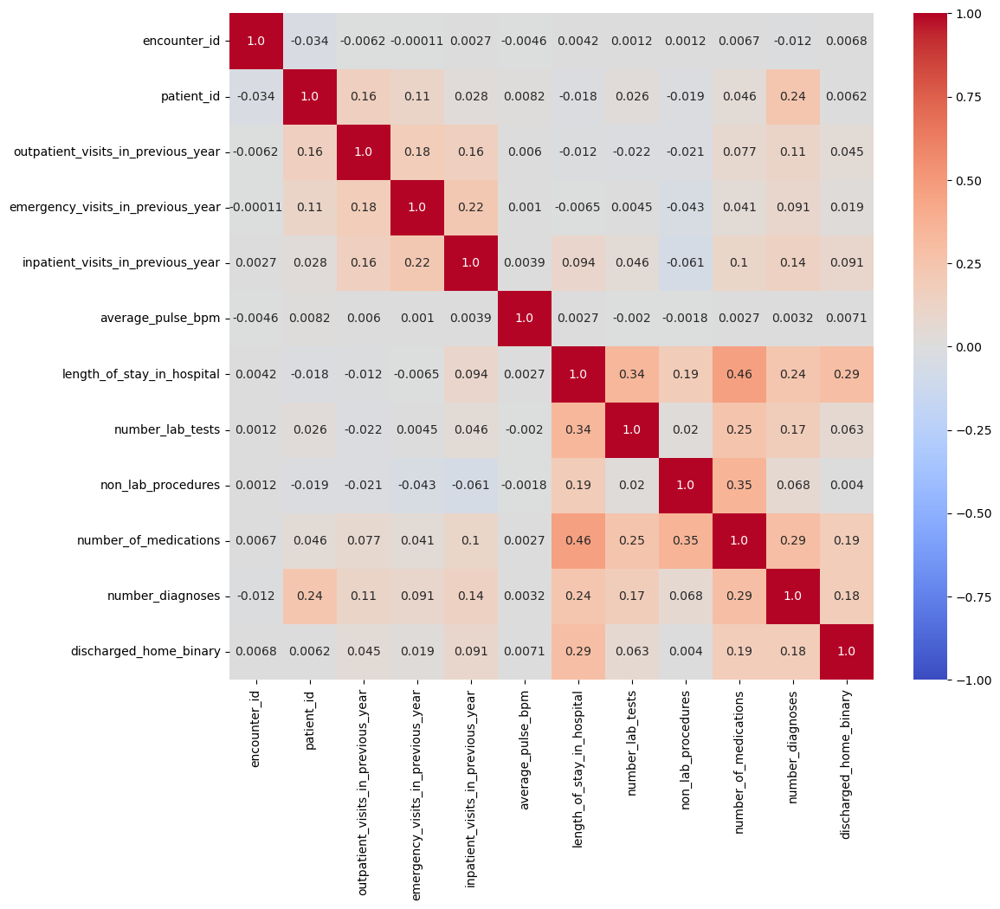

In [50]:
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, vmin=-1, vmax=1, annot = True, cmap="coolwarm", fmt='.2')
    plt.show()

cor_spearman_train4 = X_train4[metric_features_train4].corr(method='spearman')
cor_heatmap(cor_spearman_train4)
# LEN OF STAY IN HOSPITAL AND NUMBER OF MEDICATIONS ARE THE MOST CORRELATED FEATURES (50%)

## 4.3 Numeric Variables Histogram

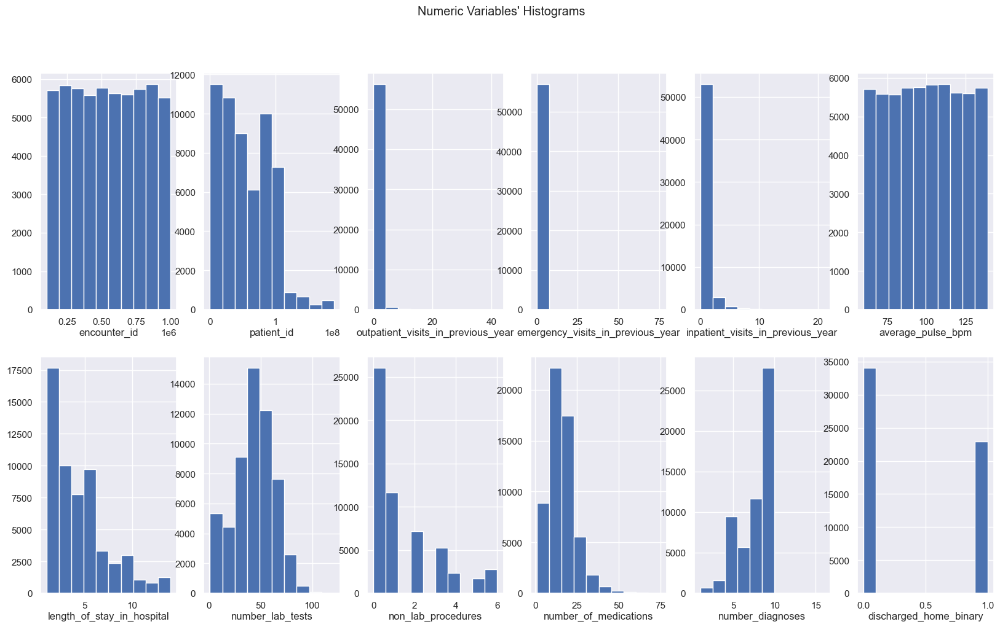

In [51]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features_train4) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features_train4): # Notice the zip() function and flatten() method
    ax.hist(X_train4[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

## 4.4 Numerical Variables BoxPlots

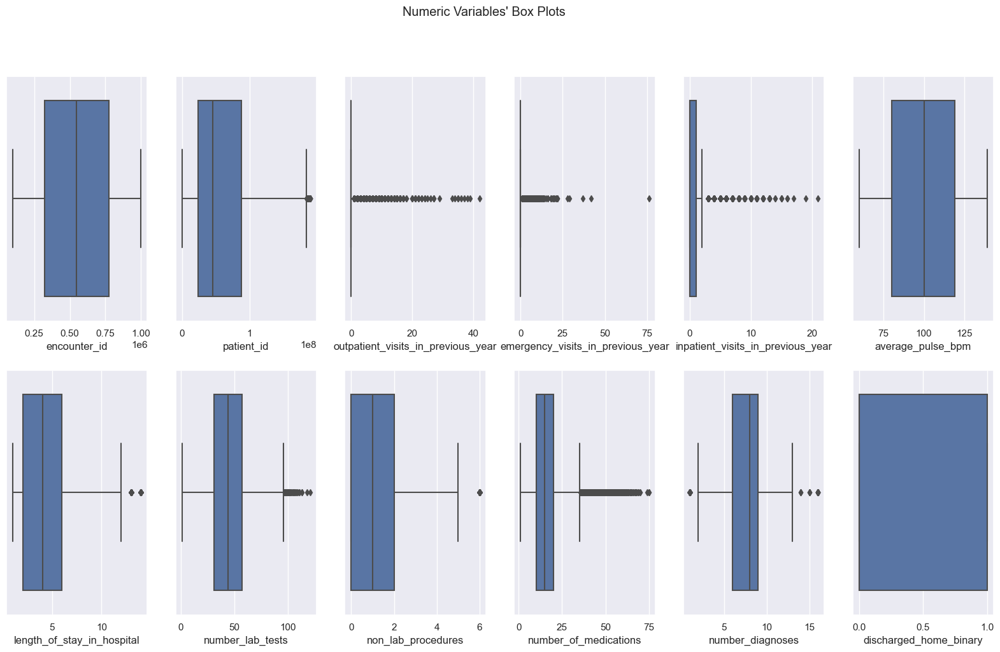

In [52]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features_train4) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features_train4): # Notice the zip() function and flatten() method
    sns.boxplot(x=X_train4[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

## 4.5 Pairwise Relationship of Numerical Variables against ReadmittedBinary

In [53]:
# Pairwise Relationship of Numerical Variables
#sns.set()

# Setting pairplot
#sns.pairplot(df[metric_features + ['readmitted_binary']], diag_kind="hist", hue='readmitted_binary')

# Layout
#plt.subplots_adjust(top=0.95)
#plt.suptitle("Pairwise Relationship of Numerical Variables against Readmitted_Binary", fontsize=20)

#plt.show()

# 5.Feature Engineering

In [54]:
#New features
X_train6 = X_train4.copy()
X_val6 = X_val4.copy()
test6 = test4.copy()

In [55]:
X_train6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56988 entries, 0 to 56987
Data columns (total 26 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           56988 non-null  int64 
 1   patient_id                             56988 non-null  int64 
 2   race                                   56988 non-null  object
 3   gender                                 56988 non-null  object
 4   age                                    56988 non-null  object
 5   outpatient_visits_in_previous_year     56988 non-null  int64 
 6   emergency_visits_in_previous_year      56988 non-null  int64 
 7   inpatient_visits_in_previous_year      56988 non-null  int64 
 8   admission_type                         56988 non-null  object
 9   medical_specialty                      56988 non-null  object
 10  average_pulse_bpm                      56988 non-null  int64 
 11  admission_sourc

## 5.1 Number of visits

In [56]:
#Create number of visits based on how many times a patient id and its encounter
X_train6['number_of_visits'] = X_train6.groupby('patient_id')['encounter_id'].transform('count')
X_val6['number_of_visits'] = X_val6.groupby('patient_id')['encounter_id'].transform('count')
test6['number_of_visits'] = test6.groupby('patient_id')['encounter_id'].transform('count')

In [57]:
#Erase patient and encounter
X_train6.drop(columns=["patient_id", "encounter_id"], inplace=True)
X_val6.drop(columns=["patient_id", "encounter_id"], inplace=True)
test6.drop(columns=["patient_id", "encounter_id"], inplace=True)

## 5.2 Total Procedures

In [58]:
#Counting number of med and non lab and number lab
X_train6['procedures'] = X_train6['non_lab_procedures'] + X_train6['number_of_medications'] + X_train6['number_lab_tests']
X_val6['procedures'] = X_val6['non_lab_procedures'] + X_val6['number_of_medications'] + X_val6['number_lab_tests']
test6['procedures'] = test6['non_lab_procedures'] + test6['number_of_medications'] + test6['number_lab_tests']

In [59]:
#Erasing columns
X_train6.drop(columns=["non_lab_procedures", "number_of_medications", "number_lab_tests"], inplace=True)
X_val6.drop(columns=["non_lab_procedures", "number_of_medications", "number_lab_tests"], inplace=True)
test6.drop(columns=["non_lab_procedures", "number_of_medications", "number_lab_tests"], inplace=True)

## 5.3 Diagnostics

http://icd9.chrisendres.com/index.php?action=contents

In [60]:
#This function is to give use this numbers and give them a range based on an article found
def change_diagnosis_values(data,c):
    save_new_data = []
    indexes = data.index.values
    for i, row in data.iterrows():
        value=row[c]
        if("V" in value):
            correct_value=18
        elif('E' in value):
            correct_value=19
        elif( '?' in value):
            correct_value = 0
        else:
            value = float(row[c])
            if value >= 1 and value <= 139:
                correct_value = 1
            if value >= 140 and value <= 239:
                correct_value = 2
            if value >= 240 and value <= 279:
                correct_value = 3
            if value >= 280 and value <= 289:
                correct_value = 4
            if value >= 290 and value <= 319:
                correct_value = 5
            if value >= 320 and value <= 389:
                correct_value = 6 
            if value >= 390 and value <= 459:
                correct_value = 7
            if value >= 460 and value <= 519:
                correct_value = 8
            if value >= 520 and value <= 579:
                correct_value = 9
            if value >= 580 and value <= 629:
                correct_value = 10
            if value >= 630 and value <= 679:
                correct_value = 11
            if value >= 680 and value <= 709:
                correct_value = 12
            if value >= 710 and value <= 739:
                correct_value = 13
            if value >= 740 and value <= 759:
                correct_value = 14
            if value >= 760 and value <= 779:
                correct_value = 15
            if value >= 780 and value <= 799:
                correct_value = 16
            if value >= 800 and value <= 999:
                correct_value = 17
        save_new_data.append(correct_value)
    return(save_new_data)

X_train6["primary_diagnosis_icd9"] = change_diagnosis_values(X_train6,'primary_diagnosis')
X_train6["secondary_diagnosis_icd9"] = change_diagnosis_values(X_train6,'secondary_diagnosis')
X_train6["additional_diagnosis_icd9"] = change_diagnosis_values(X_train6,'additional_diagnosis')
X_train6 = X_train6.drop([ 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis'], axis = 1)

X_val6["primary_diagnosis_icd9"] = change_diagnosis_values(X_val6,'primary_diagnosis')
X_val6["secondary_diagnosis_icd9"] = change_diagnosis_values(X_val6,'secondary_diagnosis')
X_val6["additional_diagnosis_icd9"] = change_diagnosis_values(X_val6,'additional_diagnosis')
X_val6 = X_val6.drop([ 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis'], axis = 1)

test6["primary_diagnosis_icd9"] = change_diagnosis_values(test6,'primary_diagnosis')
test6["secondary_diagnosis_icd9"] = change_diagnosis_values(test6,'secondary_diagnosis')
test6["additional_diagnosis_icd9"] = change_diagnosis_values(test6,'additional_diagnosis')
test6 = test6.drop([ 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis'], axis = 1)

| Category ICD-9-CM                    | Codes |
|---------------------------------------|----------------------|
| INFECTIOUS AND PARASITIC DISEASES      | 001-139              |
| NEOPLASMS                             | 140-239              |
| ENDOCRINE, NUTRITIONAL AND METABOLIC DISEASES, AND IMMUNITY DISORDERS | 240-279 |
| DISEASES OF THE BLOOD AND BLOOD-FORMING ORGANS | 280-289      |
| MENTAL DISORDERS                       | 290-319              |
| DISEASES OF THE NERVOUS SYSTEM AND SENSE ORGANS | 320-389     |
| DISEASES OF THE CIRCULATORY SYSTEM     | 390-459              |
| DISEASES OF THE RESPIRATORY SYSTEM     | 460-519              |
| DISEASES OF THE DIGESTIVE SYSTEM       | 520-579              |
| DISEASES OF THE GENITOURINARY SYSTEM   | 580-629              |
| COMPLICATIONS OF PREGNANCY, CHILDBIRTH, AND THE PUERPERIUM | 630-679 |
| DISEASES OF THE SKIN AND SUBCUTANEOUS TISSUE | 680-709        |
| DISEASES OF THE MUSCULOSKELETAL SYSTEM AND CONNECTIVE TISSUE | 710-739 |
| CONGENITAL ANOMALIES                   | 740-759              |
| CERTAIN CONDITIONS ORIGINATING IN THE PERINATAL PERIOD | 760-779 |
| SYMPTOMS, SIGNS, AND ILL-DEFINED CONDITIONS | 780-799        |
| INJURY AND POISONING                   | 800-999              |
| SUPPLEMENTARY CLASSIFICATION OF FACTORS INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES | V01-V89 |
| SUPPLEMENTARY CLASSIFICATION OF EXTERNAL CAUSES OF INJURY AND POISONING | E800-E999 |


## 5.4 Descriptive Statistics III

In [61]:
X_train6.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
race,56988,5,Caucasian,44321,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,56988,2,Female,30604,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,56988,3,elderly,39039,NaN,NaN,NaN,NaN,NaN,NaN,NaN
outpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.368464,1.28641,0.0,0.0,0.0,0.0,42.0
emergency_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.19483,0.888386,0.0,0.0,0.0,0.0,76.0
inpatient_visits_in_previous_year,56988.0,NaN,NaN,NaN,0.64131,1.27662,0.0,0.0,0.0,1.0,21.0
admission_type,56988,4,Emergency,30266,NaN,NaN,NaN,NaN,NaN,NaN,NaN
medical_specialty,56988,5,Not Saved,36524,NaN,NaN,NaN,NaN,NaN,NaN,NaN
average_pulse_bpm,56988.0,NaN,NaN,NaN,99.556363,23.031045,60.0,80.0,100.0,119.0,139.0
admission_source,56988,3,Emergency Room,32206,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [62]:
(X_val6.describe(include='all').T)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
race,14248,5,Caucasian,11143,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,14248,2,Female,7627,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,14248,3,elderly,9785,NaN,NaN,NaN,NaN,NaN,NaN,NaN
outpatient_visits_in_previous_year,14248.0,NaN,NaN,NaN,0.374088,1.291731,0.0,0.0,0.0,0.0,29.0
emergency_visits_in_previous_year,14248.0,NaN,NaN,NaN,0.201923,0.995676,0.0,0.0,0.0,0.0,63.0
inpatient_visits_in_previous_year,14248.0,NaN,NaN,NaN,0.635528,1.229201,0.0,0.0,0.0,1.0,19.0
admission_type,14248,4,Emergency,7605,NaN,NaN,NaN,NaN,NaN,NaN,NaN
medical_specialty,14248,5,Not Saved,9197,NaN,NaN,NaN,NaN,NaN,NaN,NaN
average_pulse_bpm,14248.0,NaN,NaN,NaN,99.830643,23.077888,60.0,80.0,100.0,120.0,139.0
admission_source,14248,3,Emergency Room,8132,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 6.Encoding

## 6.1 Separate numeric and categorical data

In [63]:
# Separate numeric and categorical data for Training
X_train_num = X_train6.select_dtypes(include=np.number)
X_train_cat = X_train6.select_dtypes(exclude=np.number)

# Separate numeric and categorical data for Validation
X_val_num = X_val6.select_dtypes(include=np.number)
X_val_cat = X_val6.select_dtypes(exclude=np.number)

# Separate numeric and categorical data for Validation
X_test_num = test6.select_dtypes(include=np.number)
X_test_cat = test6.select_dtypes(exclude=np.number)

## 6.2 Target Encoding

In [64]:
import pandas as pd
from category_encoders import TargetEncoder

y_train_num = y_train.replace({'No': 0, 'Yes': 1})

target_encoder = TargetEncoder()

X_train_cat.reset_index(drop=True, inplace=True)
y_train_num.reset_index(drop=True, inplace=True)

X_train_cat_encoded = target_encoder.fit_transform(X_train_cat, y_train_num)

X_val_cat.reset_index(drop=True, inplace=True)
X_val_cat_encoded = target_encoder.transform(X_val_cat)
print(X_train_cat.shape)
print(X_val_cat.shape)


X_test_cat.reset_index(drop=True, inplace=True)
X_test_cat_encoded = target_encoder.transform(X_test_cat)

X_train7 = pd.concat([X_train_num, X_train_cat_encoded], axis=1)
X_val7 = pd.concat([X_val_num, X_val_cat_encoded], axis=1)
test7 = pd.concat([X_test_num, X_test_cat_encoded], axis=1)

(56988, 11)
(14248, 11)


In [65]:
X_train7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56988 entries, 0 to 56987
Data columns (total 23 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   outpatient_visits_in_previous_year     56988 non-null  int64  
 1   emergency_visits_in_previous_year      56988 non-null  int64  
 2   inpatient_visits_in_previous_year      56988 non-null  int64  
 3   average_pulse_bpm                      56988 non-null  int64  
 4   length_of_stay_in_hospital             56988 non-null  int64  
 5   number_diagnoses                       56988 non-null  int64  
 6   discharged_home_binary                 56988 non-null  int64  
 7   number_of_visits                       56988 non-null  int64  
 8   procedures                             56988 non-null  int64  
 9   primary_diagnosis_icd9                 56988 non-null  int64  
 10  secondary_diagnosis_icd9               56988 non-null  int64  
 11  ad

.fit_transform(): This method is used on the training set. It first fits the encoder (in your case, OneHotEncoder) to the data, learning what categories exist in each feature, and then transforms the data into the new encoded format. This step is crucial for the encoder to learn the mapping from categories to integers, which is then used to create the one-hot encoded vectors.

.transform(): Once the encoder is fitted to the training data, you use .transform() on the validation (or test) data. This method does not re-fit the encoder but uses the already learned mappings from the .fit_transform() step on the training data to transform the validation data. This ensures consistency in how categories are represented across both datasets. If you were to use .fit_transform() on the validation set, the encoder might learn different category mappings, leading to inconsistencies and potentially errors if new categories present in the validation set were not seen in the training set.

In [66]:
y_val

31141     No
67901     No
34978     No
9158      No
39936     No
        ... 
5055     Yes
51895     No
57935    Yes
59991     No
31372     No
Name: readmitted_binary, Length: 14248, dtype: object

# 7.Data Scaling

In [67]:
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler(random_state=42)

# Aplicar o undersampling para X_train8 e y_train
X_undersampled_1, y_undersampled_1 = rus.fit_resample(X_train_num, y_train)


## 7.1 RobustScaler

(chekc lab 9 part I)

`When to use` 
- Use if you have outliers and don't want them to have much influence (but removing outliers is always a better option);
- Outliers have less influence than in other methods. The range is larger than MinMaxScaler or StandardScaler.

In [68]:
# Create a RobustScaler instanceand fit to your train data
# Aplica-se apenas em variáveis numéricas
robust = RobustScaler().fit(X_undersampled_1)

# Transform your train data by applying the scale obtained in the previous command
robust_X_train7 = robust.transform(X_undersampled_1)
# Transform your validation data by applying the scale obtained in the first command
robust_X_val7 = robust.transform(X_val_num)
# Transform your test data by applying the scale obtained in the first command
robust_X_test7 = robust.transform(X_test_num)

# Convert the array to a pandas dataframe Training
robust_X_train7 = pd.DataFrame(robust_X_train7, columns=X_undersampled_1.columns, index=X_undersampled_1.index)

# Validation
robust_X_val7 = pd.DataFrame(robust_X_val7, columns=X_val_num.columns, index=X_val_num.index)

# test
robust_X_test7 = pd.DataFrame(robust_X_test7, columns=X_test_num.columns, index=X_test_num.index)

In [69]:
model_robust = MLPClassifier().fit(robust_X_train7, y_undersampled_1)

y_pred = model_robust.predict(robust_X_val7)
y_pred_converted = [0 if x == 'No' else 1 for x in y_pred]
y_val_converted = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

score_robust = model_robust.score(robust_X_val7, y_val)
print(score_robust)

f1_r = f1_score(y_val_converted, y_pred_converted)
print(f1_r)
# Check the mean accuracy of your classifier in your validation data

0.7238208871420551
0.2637979420018709


## 7.2 MinMax

In [70]:
# MinMax Scaler
min_max = MinMaxScaler().fit(X_undersampled_1)

# Transformar os dados de treino
min_max_X_train7 = min_max.transform(X_undersampled_1)
min_max_X_train7 = pd.DataFrame(min_max_X_train7, columns=X_undersampled_1.columns, index=X_undersampled_1.index)

# Transformar os dados de validação
min_max_X_val7 = min_max.transform(X_val_num)
min_max_X_val7 = pd.DataFrame(min_max_X_val7, columns=X_val_num.columns, index=X_val_num.index)


In [71]:
model_min_max = MLPClassifier().fit(min_max_X_train7, y_undersampled_1)
model_min_max.score(min_max_X_val7, y_val)

y_pred1 = model_min_max.predict(min_max_X_val7)
y_pred_converted = [0 if x == 'No' else 1 for x in y_pred1]
y_val_converted = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

f1_m = f1_score(y_val_converted, y_pred_converted)
print(f1_m)
score_min_max = model_min_max.score(min_max_X_val7, y_val)
print(score_min_max)

0.27516501650165015
0.7533688938798427


## 7.3 Standart Scaler

In [72]:
# Standard Scaler
scaler = StandardScaler().fit(X_undersampled_1)

# Transformar os dados de treino
scaler_X_train7 = scaler.transform(X_undersampled_1)
scaler_X_train7 = pd.DataFrame(scaler_X_train7, columns=X_undersampled_1.columns, index=X_undersampled_1.index)

# Transformar os dados de validação
scaler_X_val7 = scaler.transform(X_val_num)
scaler_X_val7 = pd.DataFrame(scaler_X_val7, columns=X_val_num.columns, index=X_val_num.index)

In [73]:
model_scaler = MLPClassifier().fit(scaler_X_train7, y_undersampled_1)
model_scaler.score(scaler_X_val7, y_val)

y_pred2 = model_scaler.predict(scaler_X_val7)
y_pred_converted = [0 if x == 'No' else 1 for x in y_pred2]
y_val_converted = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

f1_s = f1_score(y_val_converted, y_pred_converted)
print(f1_s)
score_scaler = model_min_max.score(scaler_X_val7, y_val)
print(score_scaler)

0.2596599690880989
0.8566816395283549


In [74]:
print(score_scaler)

0.8566816395283549


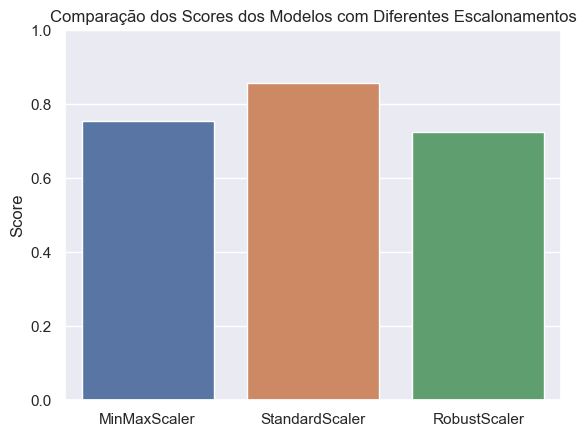

In [75]:
x = ['MinMaxScaler', 'StandardScaler', 'RobustScaler']
y = [score_min_max, score_scaler, score_robust]

sns.barplot(x=x, y=y)
plt.title('Comparação dos Scores dos Modelos com Diferentes Escalonamentos')
plt.ylabel('Score')

plt.ylim(0, 1) # Ajuste os valores conforme necessário

plt.show()


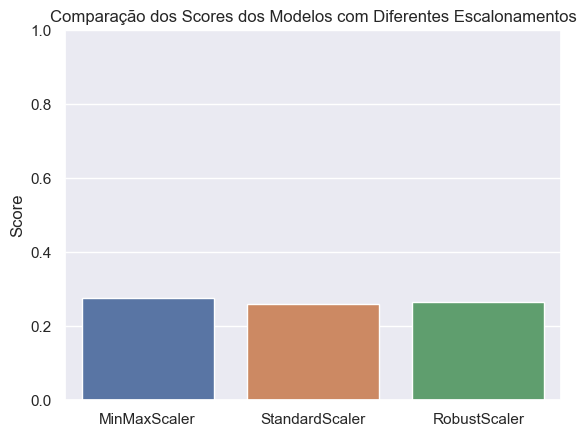

In [76]:
x = ['MinMaxScaler', 'StandardScaler', 'RobustScaler']
y = [f1_m, f1_s, f1_r]

sns.barplot(x=x, y=y)
plt.title('Comparação dos Scores dos Modelos com Diferentes Escalonamentos')
plt.ylabel('Score')

plt.ylim(0, 1) # Ajuste os valores conforme necessário

plt.show()


**We going to choose MinMaxScaler**

In [77]:
# MinMax Scaler
min_max = MinMaxScaler().fit(X_train_num)

# Transformar os dados de treino
min_max_X_train7 = min_max.transform(X_train_num)
min_max_X_train7 = pd.DataFrame(min_max_X_train7, columns=X_train_num.columns, index=X_train_num.index)

# Transformar os dados de validação
min_max_X_val7 = min_max.transform(X_val_num)
min_max_X_val7 = pd.DataFrame(min_max_X_val7, columns=X_val_num.columns, index=X_val_num.index)

# Transformar os dados de validação
min_max_X_test7 = min_max.transform(X_test_num)
min_max_X_test7 = pd.DataFrame(min_max_X_test7, columns=X_test_num.columns, index=X_test_num.index)


In [78]:
X_train7 = pd.concat([min_max_X_train7, X_train_cat_encoded], axis=1)
X_val7 = pd.concat([min_max_X_val7, X_val_cat_encoded], axis=1)
test7 = pd.concat([min_max_X_test7, X_test_cat_encoded], axis=1)

# 8.Outlier Treatment

In [79]:
X_train8 = X_train7.copy()
X_val8 = X_val7.copy()
test8 = test7.copy()

In [80]:
print(X_train8.shape)
print(X_val8.shape)


(56988, 23)
(14248, 23)


## 8.1 "Manually" filtering the dataset's outliers

In [81]:
#This transforms the outliers to nan
X_train8.loc[X_train8['inpatient_visits_in_previous_year'] > 0.90476, 'inpatient_visits_in_previous_year'] = np.nan
X_val8.loc[X_val8['inpatient_visits_in_previous_year'] > 0.90476, 'inpatient_visits_in_previous_year'] = np.nan
test8.loc[test8['inpatient_visits_in_previous_year'] > 0.90476, 'inpatient_visits_in_previous_year'] = np.nan

X_train8.loc[X_train8['outpatient_visits_in_previous_year'] > 0.78571, 'outpatient_visits_in_previous_year'] = np.nan
X_val8.loc[X_val8['outpatient_visits_in_previous_year'] > 0.78571, 'outpatient_visits_in_previous_year'] = np.nan
test8.loc[test8['outpatient_visits_in_previous_year'] > 0.78571, 'outpatient_visits_in_previous_year'] = np.nan

X_train8.loc[X_train8['emergency_visits_in_previous_year'] > 0.48684, 'emergency_visits_in_previous_year'] = np.nan
X_val8.loc[X_val8['emergency_visits_in_previous_year'] > 0.48684, 'emergency_visits_in_previous_year'] = np.nan
test8.loc[test8['emergency_visits_in_previous_year'] > 0.48684, 'emergency_visits_in_previous_year'] = np.nan

X_train8.loc[X_train8['number_diagnoses'] > 0.86666, 'number_diagnoses'] = np.nan
X_val8.loc[X_val8['number_diagnoses'] > 0.86666, 'number_diagnoses'] = np.nan
test8.loc[test8['number_diagnoses'] > 0.86666, 'number_diagnoses'] = np.nan

## 8.2 Using KNN imputer 

In [82]:
#inputing the knn on the nan
columns_to_impute = ['outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year',
                      'inpatient_visits_in_previous_year', 'number_diagnoses']

imputer = KNNImputer(n_neighbors=5, weights="uniform")
imputer.fit(X_train8[columns_to_impute])

X_train8[columns_to_impute] = imputer.transform(X_train8[columns_to_impute])

X_val8[columns_to_impute] = imputer.transform(X_val8[columns_to_impute])
test8[columns_to_impute] = imputer.transform(test8[columns_to_impute])

In [83]:
print('Percentage of data kept after removing outliers:', (np.round(X_train8.shape[0] / X_train.shape[0], 4))*100)

Percentage of data kept after removing outliers: 100.0


# 9.Feature Selection

## 9.1. Filter methods


### 9.1.1. Univariate variables

In [84]:
min_max_X_train7.var()

outpatient_visits_in_previous_year    0.000938
emergency_visits_in_previous_year     0.000137
inpatient_visits_in_previous_year     0.003696
average_pulse_bpm                     0.084991
length_of_stay_in_hospital            0.053007
number_diagnoses                      0.016718
discharged_home_binary                0.240564
number_of_visits                      0.002930
procedures                            0.019747
primary_diagnosis_icd9                0.060951
secondary_diagnosis_icd9              0.046910
additional_diagnosis_icd9             0.055682
dtype: float64

### 9.1.2. Correlation indices
    

**Spearman Correlation**

In [85]:
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

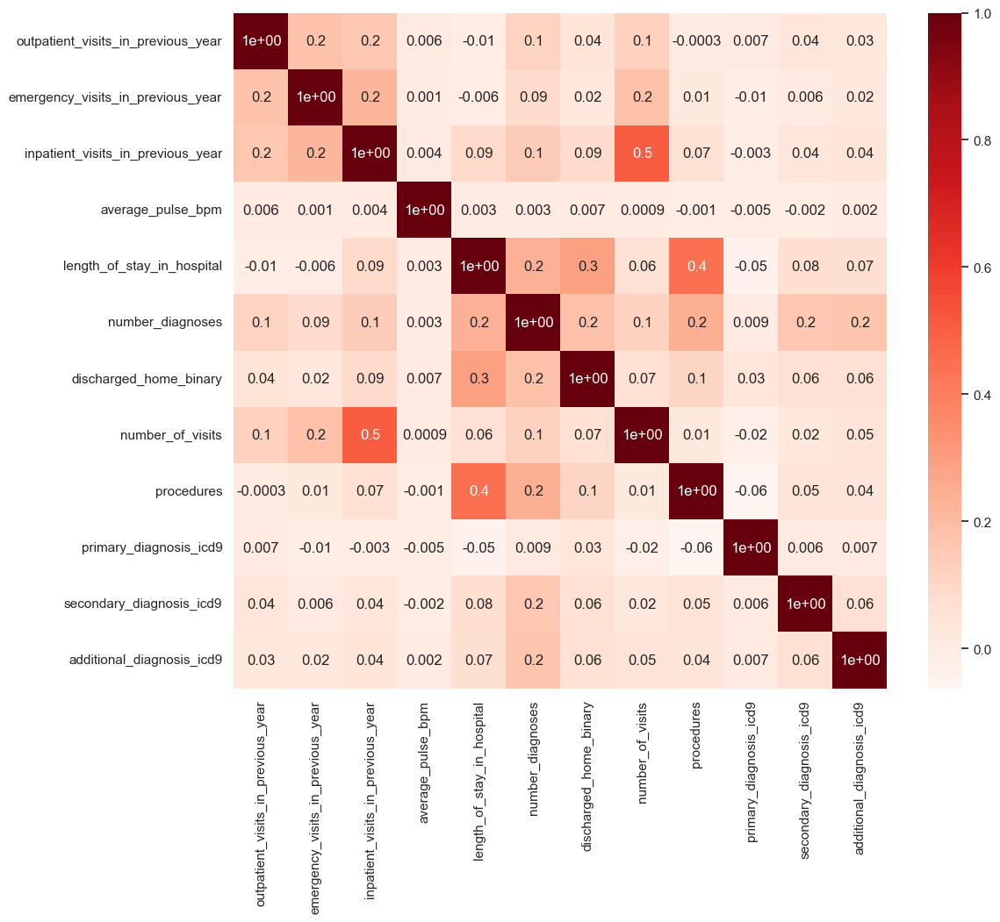

In [86]:
correlation_matrix = min_max_X_train7.corr(method='spearman')
cor_heatmap(correlation_matrix)

### 9.1.3 ANOVA

In [87]:

f_scores, p_values = f_classif(min_max_X_train7, y_train_num)

# Criando um DataFrame com os resultados
anova_results = pd.DataFrame({'Feature': min_max_X_train7.columns, 'F-Score': f_scores, 'P-Value': p_values})

# Ordenando os resultados pelo F-Score
anova_results = anova_results.sort_values(by='F-Score', ascending=False)

# Mostrando os resultados
print(anova_results)

                               Feature      F-Score       P-Value
7                     number_of_visits  2785.207324  0.000000e+00
2    inpatient_visits_in_previous_year  1698.898422  0.000000e+00
6               discharged_home_binary   286.480446  4.172377e-64
1    emergency_visits_in_previous_year   225.191194  8.343137e-51
5                     number_diagnoses   152.692588  4.958829e-35
4           length_of_stay_in_hospital    99.286542  2.283302e-23
8                           procedures    45.857549  1.284013e-11
0   outpatient_visits_in_previous_year    23.209401  1.456582e-06
9               primary_diagnosis_icd9     8.241392  4.096079e-03
11           additional_diagnosis_icd9     6.214580  1.267305e-02
3                    average_pulse_bpm     0.134681  7.136282e-01
10            secondary_diagnosis_icd9     0.026689  8.702289e-01


### 9.1.4 Mutual Information for categorical variables
https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_classif.html


In [88]:


np.random.seed(42)
mi = mutual_info_classif(X_train_cat_encoded, y_train_num)
mi= dict(zip(X_train_cat_encoded.columns, mi))
mi

{'race': 0.005547393378804832,
 'gender': 0.0066192755474485665,
 'age': 0.007508909997000268,
 'admission_type': 0.0030902924075411065,
 'medical_specialty': 0.0023969649071931,
 'admission_source': 0.006139275568108671,
 'glucose_test_result': 0.007721885256370742,
 'a1c_test_result': 0.010059659711055158,
 'change_in_meds_during_hospitalization': 0.0024405998917507166,
 'prescribed_diabetes_meds': 0.004240283954977109,
 'Medicated_Status': 0.006670855023858113}

### 9.1.5 Chi-Square for categorical data

In [89]:
def TestIndependence(X,y,var,alpha=0.05):        
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

In [90]:
for var in X_train_cat_encoded:
    TestIndependence(X_train_cat_encoded[var],y_train, var)

race is NOT an important predictor. (Discard race from model)
gender is NOT an important predictor. (Discard gender from model)
age is NOT an important predictor. (Discard age from model)
admission_type is NOT an important predictor. (Discard admission_type from model)
medical_specialty is NOT an important predictor. (Discard medical_specialty from model)
admission_source is NOT an important predictor. (Discard admission_source from model)
glucose_test_result is IMPORTANT for Prediction
a1c_test_result is IMPORTANT for Prediction
change_in_meds_during_hospitalization is NOT an important predictor. (Discard change_in_meds_during_hospitalization from model)
prescribed_diabetes_meds is NOT an important predictor. (Discard prescribed_diabetes_meds from model)
Medicated_Status is NOT an important predictor. (Discard Medicated_Status from model)


## 9.2. Wrapper Methods

### 9.2.1. RFE

**RFE accepts as base estimator any predictive model that has a way of determining feature importance**. In the case for this example, the base estimator we will use is a Logistic Regression, which uses coefficients as the way to determine the importance of different variables.


In [91]:
#no of features
nof_list=np.arange(1,20)            
high_score=0
#Variable to store the optimum features
nof=0           
train_score_list =[]
val_score_list = []

from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=42)

X_u, y_u = rus.fit_resample(min_max_X_train7,y_train)

for n in range(len(nof_list)):
    model = LogisticRegression(solver='lbfgs', random_state=42) #Se chamar LR temos q escolher o nr de variaveis so que neste dataset nao sabemos quantas sao; no loop percorre com todas e atraves do socre diz qual o melhor conjunto de variaveis
    
    rfe = RFE(estimator = model,n_features_to_select = nof_list[n])

    #Training again the model
    X_train_rfe = rfe.fit_transform(X_u, y_u)
    X_val_rfe = rfe.transform(min_max_X_val7)
    
    model.fit(X_train_rfe,y_u)

    #Obtain the scores
    #storing results on training data
    y_pred = model.predict(X_val_rfe)
    y_val_pred_converted = [0 if x == 'No' else 1 for x in y_pred]
    y_val_converted = [0 if x == 'No' else 1 for x in y_val.to_numpy()]
    train_score = f1_score(y_val_converted, y_val_pred_converted)
    print(train_score, n)
    train_score_list.append(train_score)

    #storing results on training data
    val_score = model.score(X_val_rfe,y_val)
    val_score_list.append(val_score)
    
    #check best score
    if(train_score >= high_score):
        high_score = train_score
        nof = nof_list[n]
        
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

0.11913175164058556 0
0.2437641723356009 1
0.24362606232294617 2
0.23446153846153844 3
0.2557122022362664 4
0.2508361204013378 5
0.24958323410335792 6
0.24816481174520486 7
0.24531835205992514 8
0.24736965162497077 9
0.24790307548928234 10
0.24725915558665731 11
0.24725915558665731 12
0.24725915558665731 13
0.24725915558665731 14
0.24725915558665731 15
0.24725915558665731 16
0.24725915558665731 17
0.24725915558665731 18
Optimum number of features: 5
Score with 5 features: 0.255712


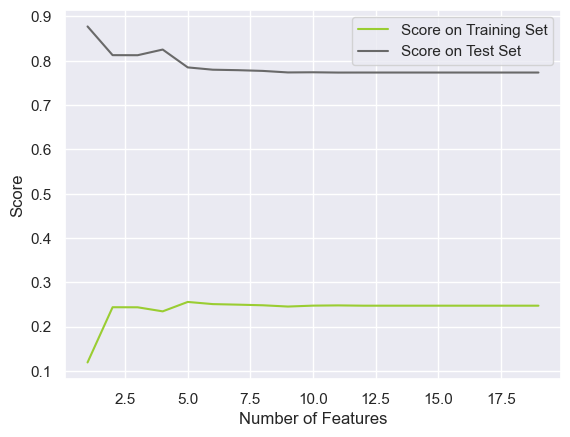

In [92]:
plt.plot(nof_list, train_score_list, label="Score on Training Set", color='yellowgreen')
plt.plot(nof_list, val_score_list, label="Score on Test Set", color='dimgray')
plt.xlabel("Number of Features")
plt.ylabel("Score")
plt.legend()
plt.show()

In [93]:
rfe = RFE(estimator = model, n_features_to_select = 5)
X_rfe = rfe.fit_transform(min_max_X_train7, y_train)
selected_features = pd.Series(rfe.support_, index = (min_max_X_train7.columns))
selected_features

outpatient_visits_in_previous_year     True
emergency_visits_in_previous_year     False
inpatient_visits_in_previous_year      True
average_pulse_bpm                     False
length_of_stay_in_hospital            False
number_diagnoses                       True
discharged_home_binary                 True
number_of_visits                       True
procedures                            False
primary_diagnosis_icd9                False
secondary_diagnosis_icd9              False
additional_diagnosis_icd9             False
dtype: bool

## 9.3. Embedded Methods

### 9.3.1. Lasso Regression

In [94]:
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()

In [95]:


# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable
y_train_encoded = label_encoder.fit_transform(y_train)

# Now fit the LassoCV model with the encoded target variable
reg = LassoCV()
reg.fit(min_max_X_train7, y_train_encoded)

# Your other code for plotting feature importance can follow here


LassoCV()

In [96]:
coef = pd.Series(reg.coef_, index = (min_max_X_train7.columns))
coef

outpatient_visits_in_previous_year   -0.049878
emergency_visits_in_previous_year     0.072345
inpatient_visits_in_previous_year     0.301757
average_pulse_bpm                     0.000742
length_of_stay_in_hospital            0.010025
number_diagnoses                      0.041381
discharged_home_binary                0.036040
number_of_visits                      1.031403
procedures                            0.020440
primary_diagnosis_icd9               -0.005706
secondary_diagnosis_icd9             -0.007350
additional_diagnosis_icd9            -0.001026
dtype: float64

In [97]:
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 12 variables and eliminated the other 0 variables


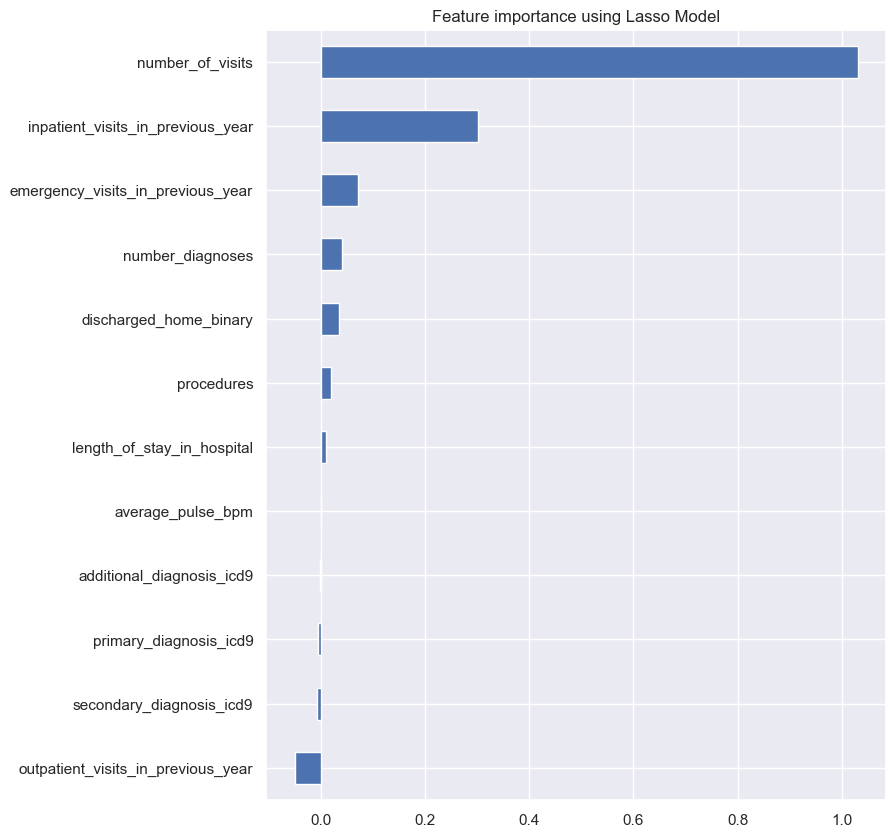

In [98]:
plot_importance(coef,'Lasso')

In [99]:
min_max_X_train7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56988 entries, 0 to 56987
Data columns (total 12 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   outpatient_visits_in_previous_year  56988 non-null  float64
 1   emergency_visits_in_previous_year   56988 non-null  float64
 2   inpatient_visits_in_previous_year   56988 non-null  float64
 3   average_pulse_bpm                   56988 non-null  float64
 4   length_of_stay_in_hospital          56988 non-null  float64
 5   number_diagnoses                    56988 non-null  float64
 6   discharged_home_binary              56988 non-null  float64
 7   number_of_visits                    56988 non-null  float64
 8   procedures                          56988 non-null  float64
 9   primary_diagnosis_icd9              56988 non-null  float64
 10  secondary_diagnosis_icd9            56988 non-null  float64
 11  additional_diagnosis_icd9           56988

## 9.4 Decision Trees

### 9.4.1 Metric Features

<Axes: xlabel='Value', ylabel='Col'>

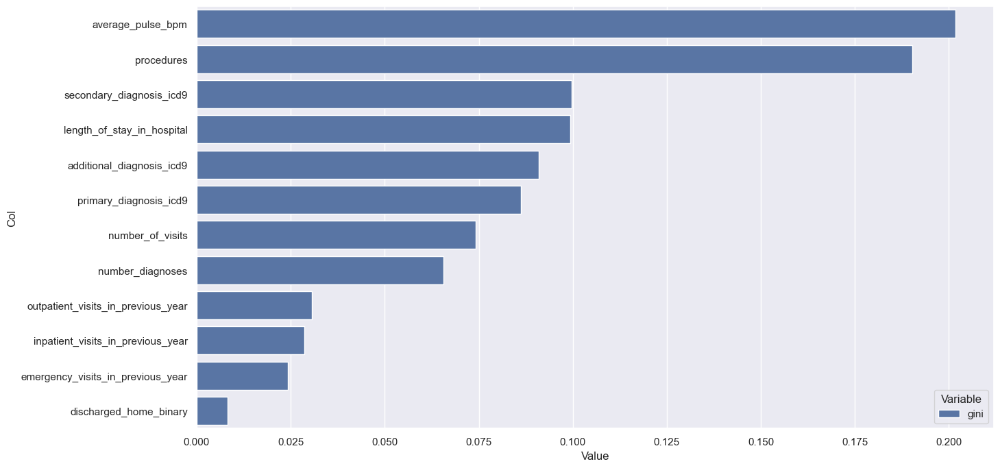

In [100]:
#Decision trees
gini_importance = DecisionTreeClassifier().fit(min_max_X_train7, y_train).feature_importances_

import seaborn as sns

zippy = pd.DataFrame(zip(gini_importance), columns = ['gini'])
zippy['col'] = min_max_X_train7.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

### 9.3.2 Non Metric Features

<Axes: xlabel='Value', ylabel='Col'>

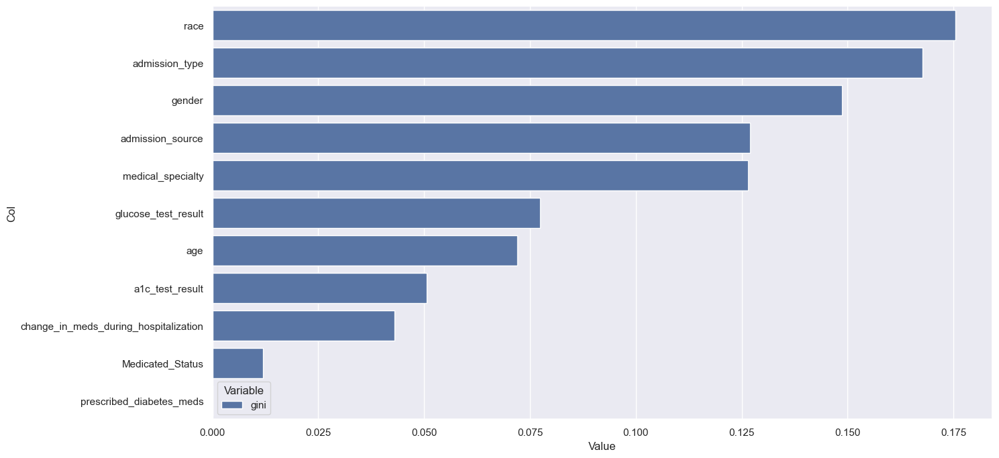

In [101]:
gini_importance = DecisionTreeClassifier().fit(X_train_cat_encoded, y_train).feature_importances_

import seaborn as sns

zippy = pd.DataFrame(zip(gini_importance), columns = ['gini'])
zippy['col'] = X_train_cat_encoded.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)


## 9.5 Tables 

| Feature                              | LASSO | RFE | ANOVA | DT | Spearman | Approach |
|--------------------------------------|:-----:|:---:|:-----:|:--:|:--------:|:--------:|
| outpatient_visits_in_previous_year   |   X   |  X  |   X   |    |    X     |   Keep   |
| emergency_visits_in_previous_year    |   X   |    |   X   |    |    X     |   Discard   |
| inpatient_visits_in_previous_year    |   X   |  X  |   X   |    |    X     |   Keep   |
| average_pulse_bpm                    |   X   |     |       |  X |    X     | Discard  |
| length_of_stay_in_hospital           |   X   |    |   X   |  X |    X     |   Keep   |
| number_diagnoses                     |   X   |  X  |   X   |  X |    X     |   Keep   |
| discharged_home_binary               |   X   |  X  |   X   |    |    X     |   Keep   |
| number_of_visits                     |   X   |  X  |   X   |  X |    X     |   Keep   |
| primary_diagnosis_icd9               |   X   |     |   X   |  X |    X     |   Keep   |
| secondary_diagnosis_icd9             |   X   |     |       |  X |    X     | Discard  |
| additional_diagnosis_icd9            |   X   |     |   X   |  X |    X     |   Keep   |
| procedures                           |    X   |   |   X    |  X  |   X       |     Keep     |


| Feature                                | Mutual Information | Chi-squared | Decision Tree | Approach |
|:---------------------------------------|:------------------:|:-----------:|:-------------:|:--------:|
| race                                   |           X         |             |       X       |   Keep   |
| gender                                 |          X          |             |       X       |   Keep   |
| age                                    |         X           |             |        X      |   Keep   |
| admission_type                         |                    |             |       X       |   Discard   |
| medical_specialty                      |                    |             |       X       |   Discard   |
| admission_source                       |         X           |             |       X       |   Keep   |
| glucose_test_result                    |         X          |      X      |        X      |   Keep   |
| a1c_test_result                        |                    |      X      |       X       |   Keep   |
| change_in_meds_during_hospitalization  |                    |             |              | Discard  |
| prescribed_diabetes_meds               |                    |             |               | Discard  |
| Medicated_Status                       |        X            |             |               | Discard  |


# 10.Modelling

In [102]:
X_train9 = X_train8.copy()
X_val9 = X_val8.copy()
test9 = test8.copy()

In [103]:
#Feature selection
columns_to_keep = [
    'outpatient_visits_in_previous_year',
    'inpatient_visits_in_previous_year',
    'length_of_stay_in_hospital',
    'number_diagnoses',
    'discharged_home_binary',
    'number_of_visits',
    'primary_diagnosis_icd9',
    'additional_diagnosis_icd9',
    'procedures',
    'a1c_test_result',
    'gender',
    'race',
    'age',
    'admission_source',
    'glucose_test_result'
]

X_train8_fs = X_train9[columns_to_keep]
X_val8_fs = X_val9[columns_to_keep]
test9_fs = test9[columns_to_keep]

| Feature                                  |
|------------------------------------------|
| outpatient_visits_in_previous_year       |
| inpatient_visits_in_previous_year        |
| length_of_stay_in_hospital               |
| number_diagnoses                         |
| discharged_home_binary                   |
| number_of_visits                         |
| primary_diagnosis_icd9                   |
| additional_diagnosis_icd9                |
| procedures                               |
| a1c_test_result                          |
| gender                                   |
| race                                     |
| age                                      |
| admission_source                         |
| glucose_test_result                      |


In [104]:

categorical_columns_train = []
numerical_columns_train = []

for col in X_train9.columns:
    if X_train9[col].dtype == 'object':
        categorical_columns_train.append(col)

    if X_train9[col].dtype in ['int64', 'float64', 'int32']:
        numerical_columns_train.append(col)

print("Categorical Columns in X_train8:", categorical_columns_train)
print("Numerical Columns in X_train8:", numerical_columns_train)

categorical_columns_val = []
numerical_columns_val = []

for col in X_val9.columns:
    if X_val9[col].dtype == 'object':
        categorical_columns_val.append(col)

    if X_val9[col].dtype in ['int64', 'float64', 'int32']:
        numerical_columns_val.append(col)

print("Categorical Columns in X_val8:", categorical_columns_val)
print("Numerical Columns in X_val8:", numerical_columns_val)


Categorical Columns in X_train8: []
Numerical Columns in X_train8: ['outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year', 'average_pulse_bpm', 'length_of_stay_in_hospital', 'number_diagnoses', 'discharged_home_binary', 'number_of_visits', 'procedures', 'primary_diagnosis_icd9', 'secondary_diagnosis_icd9', 'additional_diagnosis_icd9', 'race', 'gender', 'age', 'admission_type', 'medical_specialty', 'admission_source', 'glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'Medicated_Status']
Categorical Columns in X_val8: []
Numerical Columns in X_val8: ['outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year', 'average_pulse_bpm', 'length_of_stay_in_hospital', 'number_diagnoses', 'discharged_home_binary', 'number_of_visits', 'procedures', 'primary_diagnosis_icd9', 'secondary_diagnosis_icd9', 'additional_diagnosis_icd9', '

## Undersampling

In [105]:
from imblearn.under_sampling import RandomUnderSampler

ru = RandomUnderSampler(random_state=42)

# Aplicar o undersampling para X_train8 e y_train
X_undersampled_fs, y_undersampled_fs = ru.fit_resample(X_train8_fs, y_train)

https://scikit-learn.org/stable/modules/cross_validation.html#stratified-k-fold

In [106]:
stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

## 10.1 Logistic Regression

In [107]:
# NA REGRESSÃO LOGISTICA A VARIÁVEL TARGET É SEMPRE CATEGÓRICA (BINÁRIA)
# ESTE MODELO É SENSIVEL AOS TIPOS DE DADOS USADOS, OU SEJA, À DIMENSIONALIDADE DO DATAFRAME
# TEMOS QUE TER ESPECIAL ATENÇÃO ÀS VARIÁVEIS CONTÍNUAS - DISCREPÂNCIAS ETC

### 10.1.1 UnderSampling with FS

In [108]:
modelLR_fs = LogisticRegression(solver='lbfgs', random_state=42)

#CROSS-VALIDATION
scores = cross_val_score(modelLR_fs, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print("Cross-Validation Scores: ", scores)
mean_accuracy_lr_train_fs = scores.mean()
print("Mean Training Accuracy:", mean_accuracy_lr_train_fs)

modelLR_fs.fit(X_undersampled_fs, y_undersampled_fs)

#PREDICTING ON TRAIN
y_train_pred = modelLR_fs.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

#EVALUATE THE MODEL
accuracy_lr_train_fs = accuracy_score(y_train_converted, y_train_pred_converted)
f1_lr_train_fs = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Converted Training Set:")
print("Accuracy:", accuracy_lr_train_fs)
print("F1 Score:", f1_lr_train_fs)
print("\nClassification Report for the Converted Validation Set:")
print(classification_report(y_train_converted, y_train_pred_converted))

#PREDICTING ON VALIDATION
y_val_pred = modelLR_fs.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

#EVALUTE THE MODEL
accuracy_lr_val_fs = accuracy_score(y_val_converted, y_val_pred_converted)
f1_val = f1_score(y_val_converted, y_val_pred_converted)

#CONFUSION MATRIX
conf_matrix_val = confusion_matrix(y_val_converted, y_val_pred_converted)

print("\nPerformance on the Converted Validation Set:")
print("Accuracy:", accuracy_lr_val_fs)
print("F1 Score:", f1_val)
print("\nClassification Report for the Converted Validation Set:")
print(classification_report(y_val_converted, y_val_pred_converted))
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)


Cross-Validation Scores:  [0.63931223 0.65416178 0.65494334 0.62602579 0.63604378]
Mean Training Accuracy: 0.6420973852117394

Performance on the Converted Training Set:
Accuracy: 0.6436610911364702
F1 Score: 0.6044251626898048

Classification Report for the Converted Validation Set:
              precision    recall  f1-score   support

           0       0.62      0.74      0.68      6397
           1       0.68      0.54      0.60      6397

    accuracy                           0.64     12794
   macro avg       0.65      0.64      0.64     12794
weighted avg       0.65      0.64      0.64     12794


Performance on the Converted Validation Set:
Accuracy: 0.7784250421111735
F1 Score: 0.25100830367734284

Classification Report for the Converted Validation Set:
              precision    recall  f1-score   support

           0       0.91      0.83      0.87     12695
           1       0.20      0.34      0.25      1553

    accuracy                           0.78     14248
   macro

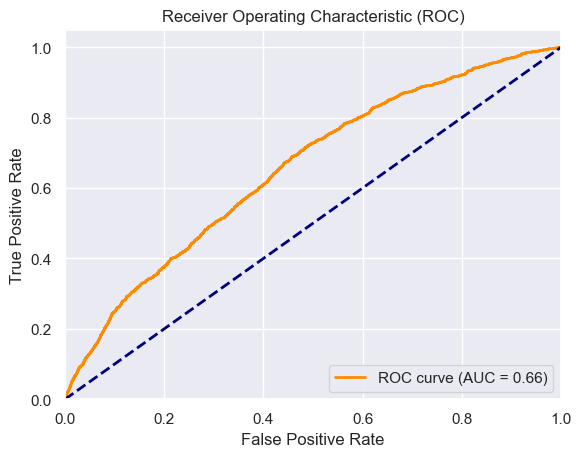

In [109]:
y_val_proba1 = modelLR_fs.predict_proba(X_val8_fs)[:, 1]
fpr_lr, tpr_lr, thresholds = roc_curve(y_val_converted, y_val_proba1)
auc_lr = roc_auc_score(y_val_converted, y_val_proba1)

plt.figure()
plt.plot(fpr_lr, tpr_lr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_lr)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()



## 10.2 Naive Bayes

### 10.2.1 UnderSampling with FS

In [110]:
modelNB = GaussianNB(var_smoothing=0.0001)

#CROSS-VALIDATION
scores = cross_val_score(modelNB, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print("Cross-Validation Scores: ", scores)
mean_accuracy_nb_train_fs = scores.mean()
print("Mean Training Accuracy:", mean_accuracy_nb_train_fs)

modelNB.fit(X_undersampled_fs, y_undersampled_fs)

#PREDICTING ON TRAIN
y_train_pred = modelNB.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

#EVALUATE THE MODEL
accuracy_nb_train_fs = accuracy_score(y_train_converted, y_train_pred_converted)
f1_nb_train_fs = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Converted Training Set:")
print("Accuracy:", accuracy_nb_train_fs)
print("F1 Score:", f1_nb_train_fs)
print("\nClassification Report for the Converted Validation Set:")
print(classification_report(y_train_converted, y_train_pred_converted))

#PREDICTING ON VALIDATION
y_val_pred = modelNB.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted2 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

# EVALUATE THE MODEL
accuracy_nb_val_fs = accuracy_score(y_val_converted2, y_val_pred_converted)
f1_nb_val_fs = f1_score(y_val_converted2, y_val_pred_converted)

#CONFUSION MATRIX
conf_matrix_val = confusion_matrix(y_val_converted2, y_val_pred_converted)

print("\nPerformance on the Converted Validation Set:")
print("Accuracy:", accuracy_nb_val_fs)
print("F1 Score:", f1_nb_val_fs)
print("\nClassification Report for the Converted Validation Set:")
print(classification_report(y_val_converted2, y_val_pred_converted))
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)


Cross-Validation Scores:  [0.59515436 0.59984369 0.59867136 0.58851114 0.58795934]
Mean Training Accuracy: 0.5940279765020116

Performance on the Converted Training Set:
Accuracy: 0.5949663904955448
F1 Score: 0.4406303972366149

Classification Report for the Converted Validation Set:
              precision    recall  f1-score   support

           0       0.56      0.87      0.68      6397
           1       0.71      0.32      0.44      6397

    accuracy                           0.59     12794
   macro avg       0.64      0.59      0.56     12794
weighted avg       0.64      0.59      0.56     12794


Performance on the Converted Validation Set:
Accuracy: 0.8333099382369455
F1 Score: 0.2101762554040572

Classification Report for the Converted Validation Set:
              precision    recall  f1-score   support

           0       0.90      0.91      0.91     12695
           1       0.22      0.20      0.21      1553

    accuracy                           0.83     14248
   macro 

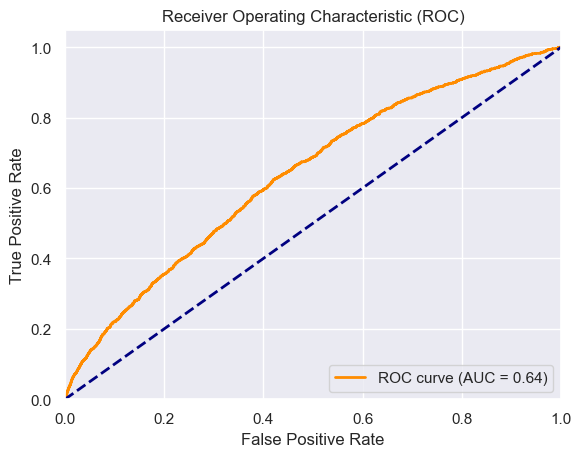

In [111]:
y_val_proba2 = modelNB.predict_proba(X_val8_fs)[:, 1]

fpr_nb, tpr_nb, thresholds = roc_curve(y_val_converted2, y_val_proba2)

auc_nb = roc_auc_score(y_val_converted2, y_val_proba2)

plt.figure()
plt.plot(fpr_nb, tpr_nb, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_nb)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()



## 10.3 KNN Classifier

### 10.3.1 Testing parameters with FS

In [112]:
# Define the range of neighbors, algorithms, weights, and metrics
numberK_list = np.arange(1, 5)
algorithms = ['auto', 'ball_tree', 'kd_tree', 'brute']
weights = ['uniform', 'distance']
metrics = ['euclidean', 'manhattan', 'minkowski']

# Initialize variables to store the best parameters and their score
best_score = 0
best_f1 = 0
best_params = {}

# Convert 'No'/'Yes' to 0/1 for y_val
y_val_binary = [0 if x == 'No' else 1 for x in y_val]

# Iterate over all combinations of parameters
for algorithm in algorithms:
    for weight in weights:
        for metric in metrics:
            for n in numberK_list:
                model = KNeighborsClassifier(n_neighbors=n, algorithm=algorithm, weights=weight, metric=metric)
                model.fit(X_undersampled_fs, y_undersampled_fs)
                y_val_pred = model.predict(X_val8_fs)

                # Convert 'No'/'Yes' to 0/1 for y_val_pred
                y_val_pred_binary = [0 if x == 'No' else 1 for x in y_val_pred]

                # Calculate accuracy and F1 score
                score_val = accuracy_score(y_val_binary, y_val_pred_binary)
                f1_val = f1_score(y_val_binary, y_val_pred_binary)

                # Update the best parameters if current F1 score is higher
                if f1_val > best_f1:
                    best_f1 = f1_val
                    best_score = score_val
                    best_params = {'n_neighbors': n, 'algorithm': algorithm, 'weights': weight, 'metric': metric}

# Print the best parameters and their scores
print("Best combination of parameters:")
print("Number of Neighbors:", best_params['n_neighbors'])
print("Algorithm:", best_params['algorithm'])
print("Weight Type:", best_params['weights'])
print("Distance Metric:", best_params['metric'])
print("Validation Accuracy:", best_score)
print("Best F1 Score:", best_f1)

Best combination of parameters:
Number of Neighbors: 4
Algorithm: auto
Weight Type: distance
Distance Metric: manhattan
Validation Accuracy: 0.6397389107243122
Best F1 Score: 0.20848111025443333


### 10.3.2 KNN UnderSampling with FS

In [113]:
modelKNN_fs = KNeighborsClassifier(n_neighbors=4, algorithm='auto', weights='distance', metric='manhattan')

#CROSS-VALIDATION
scores = cross_val_score(modelKNN_fs, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print("Cross-Validation Scores: ", scores)
mean_accuracy_knn_fs_train = scores.mean()
print("Mean Training Accuracy:", mean_accuracy_knn_fs_train)

modelKNN_fs.fit(X_undersampled_fs, y_undersampled_fs)

#PREDICTING ON TRAIN
y_train_pred = modelKNN_fs.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

#EVALUATE THE MODEL
accuracy_knn_fs_train = accuracy_score(y_train_converted, y_train_pred_converted)
f1_knn_fs_train = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Converted Training Set:")
print("Accuracy:", accuracy_knn_fs_train)
print("F1 Score:", f1_knn_fs_train)
print("\nClassification Report for the Converted Validation Set:")
print(classification_report(y_train_converted, y_train_pred_converted))

#PREDICTING ON VALIDATION
y_val_pred = modelKNN_fs.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted3 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

#EVALUATE ON VALIDATION
accuracy_knn_fs_val = accuracy_score(y_val_converted3, y_val_pred_converted)
f1_knn_fs_val = f1_score(y_val_converted3, y_val_pred_converted)

#CONFUSION MATRIX
conf_matrix_val = confusion_matrix(y_val_converted3, y_val_pred_converted)

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_knn_fs_val)
print("Validation Set F1 Score:", f1_knn_fs_val)
print("\nClassification Report for the Converted Validation Set:")
print(classification_report(y_val_converted3, y_val_pred_converted))

print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)



Cross-Validation Scores:  [0.59163736 0.57835092 0.58030481 0.55920281 0.57544957]
Mean Training Accuracy: 0.576989093362249

Performance on the Converted Training Set:
Accuracy: 0.9997655150851962
F1 Score: 0.9997654600891251

Classification Report for the Converted Validation Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6397
           1       1.00      1.00      1.00      6397

    accuracy                           1.00     12794
   macro avg       1.00      1.00      1.00     12794
weighted avg       1.00      1.00      1.00     12794


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.6397389107243122
Validation Set F1 Score: 0.20848111025443333

Classification Report for the Converted Validation Set:
              precision    recall  f1-score   support

           0       0.91      0.66      0.77     12695
           1       0.14      0.44      0.21      1553

    accuracy                     

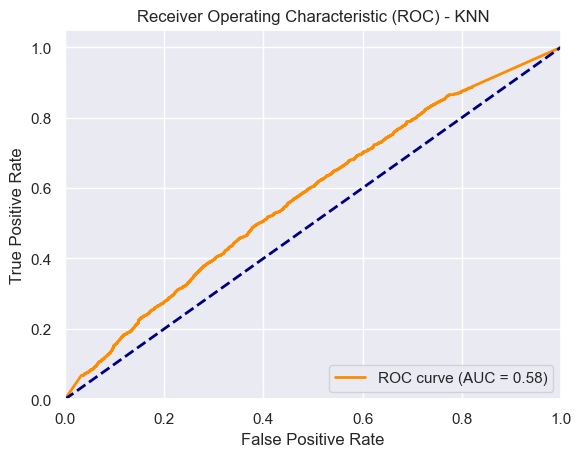

In [114]:
# Predict probabilities on the validation set
y_val_proba3 = modelKNN_fs.predict_proba(X_val8_fs)[:, 1]

# Compute ROC curve and ROC AUC
fpr_knn, tpr_knn, thresholds = roc_curve(y_val_converted3, y_val_proba3)
auc_knn = roc_auc_score(y_val_converted3, y_val_proba3)

# Plot ROC curve
plt.figure()
plt.plot(fpr_knn, tpr_knn, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_knn)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - KNN')
plt.legend(loc="lower right")
plt.show()


## 10.4 MLP Classifier

### 10.4.1 Function evalute model parameters

In [115]:
def evaluate_model(model, X_train, y_train, X_val, y_val):
    skf = StratifiedKFold(n_splits=10)
    scores_train = []
    scores_val = []
    times = []
    n_iters = []

    
    for train_index, val_index in skf.split(X_train, y_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
        
        begin = time.perf_counter()
        model.fit(X_train_fold, y_train_fold)
        end = time.perf_counter()
        y_pred = model.predict(X_val8_fs)
        y_train_pred = model.predict(X_train_fold)
        
        y_val_converted = [0 if x == 'No' else 1 for x in y_val.to_numpy()]
        y_pred_converted = [0 if x == 'No' else 1 for x in y_pred]
        
        y_train_fold_converted =[0 if x == 'No' else 1 for x in y_train_fold]
        y_train_pred_converted =[0 if x == 'No' else 1 for x in y_train_pred]
 
        train_score = f1_score(y_train_pred_converted, y_train_fold_converted)
        val_score = f1_score(y_pred_converted, y_val_converted)
        
        
        n_iter = model.n_iter_
        
        scores_train.append(train_score)
        scores_val.append(val_score)
        
        times.append(end - begin)
        n_iters.append(n_iter)
    
    avg_time = np.mean(times)
    avg_train_score = np.mean(scores_train)
    avg_val_score = np.mean(scores_val)
    avg_n_iter = np.mean(n_iters)
    
    return avg_time, avg_train_score, avg_val_score, avg_n_iter

### 10.4.2 Testing Hidden Layers

In [116]:


# Assuming evaluate_model function is defined as per the previous response

# Define your models
model_simple = MLPClassifier(hidden_layer_sizes=(8), random_state=42) #este
model_medium = MLPClassifier(hidden_layer_sizes=(4, 4), random_state=42)
model_complex = MLPClassifier(hidden_layer_sizes=(3, 3, 3), random_state=42)
model_four = MLPClassifier(hidden_layer_sizes=(4), random_state=42)  
model_simple1 = MLPClassifier(hidden_layer_sizes=(5,5), random_state=42)
model_simple2 = MLPClassifier(hidden_layer_sizes=(12), random_state=42) #este
model_simple3 = MLPClassifier(hidden_layer_sizes=(3), random_state=42)
model_simple4 = MLPClassifier(hidden_layer_sizes=(10), random_state=42) #este


# DataFrame to store results
df_varied_layers = pd.DataFrame(columns=['Time', 'Train F1 Score', 'Validation F1 Score', 'Iterations'], index=['Small Layers', 'Medium Layers', 'Large Layers', 'Extra', 'Extra1', 'Extra2', 'Extra3', 'Extra4'])

# List of models and their names
models = [model_simple, model_medium, model_complex, model_four, model_simple1, model_simple2, model_simple3, model_simple4]
model_names = ['Small Layers', 'Medium Layers', 'Large Layers', 'Extra', 'Extra1', 'Extra2', 'Extra3', 'Extra4']


for model, name in zip(models, model_names):
    avg_time, avg_train_f1_score, avg_val_f1_score, avg_n_iter = evaluate_model(model, X_undersampled_fs, y_undersampled_fs, X_val8_fs, y_val)
    df_varied_layers.loc[name] = [avg_time, avg_train_f1_score, avg_val_f1_score, avg_n_iter]

df_varied_layers


,Time,Train F1 Score,Validation F1 Score,Iterations
Small Layers,2.983951,0.679814,0.278124,174.6
Medium Layers,2.953286,0.676881,0.275374,151.0
Large Layers,2.990178,0.685105,0.275917,126.6
Extra,2.861832,0.677423,0.277108,198.8
Extra1,2.821073,0.680595,0.276449,141.8
Extra2,3.183891,0.682135,0.279748,197.1
Extra3,2.451382,0.662853,0.274927,167.9
Extra4,2.868339,0.68151,0.279785,185.8


https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

### 10.4.5 GridSearch

In [117]:
param_grid = {
    'hidden_layer_sizes': [(8), (12), (10)],
    'solver': ['lbfgs', 'adam', 'sgd'],
    'activation': ['logistic', 'tanh', 'relu'],
    'learning_rate': ['constant','adaptive'],
    'max_iter': [100,200,300],
    'learning_rate_init': [0.1, 0.01, 0.001] 
}

model = MLPClassifier(random_state=42)

grid_search = GridSearchCV(model, param_grid, cv=stratified_k_fold, scoring='f1', verbose=3)

grid_search.fit(X_undersampled_fs, y_undersampled_fs)  

# Obtendo os melhores parâmetros e o melhor score
best_parameters = grid_search.best_params_

print("Melhores parâmetros:", best_parameters)


Fitting 5 folds for each of 486 candidates, totalling 2430 fits
[CV 1/5] END activation=logistic, hidden_layer_sizes=8, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.3s
[CV 2/5] END activation=logistic, hidden_layer_sizes=8, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.3s
[CV 3/5] END activation=logistic, hidden_layer_sizes=8, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.2s
[CV 4/5] END activation=logistic, hidden_layer_sizes=8, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.2s
[CV 5/5] END activation=logistic, hidden_layer_sizes=8, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=lbfgs;, score=nan total time=   0.2s
[CV 1/5] END activation=logistic, hidden_layer_sizes=8, learning_rate=constant, learning_rate_init=0.1, max_iter=100, solver=a

### 10.4.6 UnderSampling with FS

In [118]:
modelMLP_fs = MLPClassifier(activation='logistic', hidden_layer_sizes=(8), solver='lbfgs', learning_rate_init=0.1, max_iter=100, learning_rate='constant')

#CROSS-VALIDATION
scores = cross_val_score(modelMLP_fs, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print("Cross-Validation Scores: ", scores)
mean_accuracy_mlp_train = scores.mean()
print("Mean Training Accuracy:", mean_accuracy_mlp_train)

modelMLP_fs.fit(X_undersampled_fs, y_undersampled_fs)

#PREDICTING ON TRAIN
y_train_pred = modelMLP_fs.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

#EVALUATE THE MODEL
accuracy_mlp_fs_train = accuracy_score(y_train_converted, y_train_pred_converted)
f1_mlp_fs_train = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Converted Training Set:")
print("Accuracy:", accuracy_mlp_fs_train)
print("F1 Score:", f1_mlp_fs_train)
print("\nClassification Report for the Converted Validation Set:")
print(classification_report(y_train_converted, y_train_pred_converted))

#PREDICTING ON VALIDATION
y_val_pred = modelMLP_fs.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted4 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

#EVALUATE THE MODEL
accuracy_mlp_fs_val = accuracy_score(y_val_converted4, y_val_pred_converted)
f1_mlp_fs_val = f1_score(y_val_converted4, y_val_pred_converted)

#CONFUSION MATRIX
confusion_val = confusion_matrix(y_val_converted4, y_val_pred_converted)
classification_rep_val = classification_report(y_val_converted4, y_val_pred_converted)

print("\nPerformance on the Converted Validation Set:")
print("Accuracy:", accuracy_mlp_fs_val)
print("F1 Score:", f1_mlp_fs_val)
print("\nConfusion Matrix:\n", confusion_val)
print("\nClassification Report:\n", classification_rep_val)



Cross-Validation Scores:  [0.66979289 0.67643611 0.667839   0.65494334 0.6825645 ]
Mean Training Accuracy: 0.6703151672140303

Performance on the Converted Training Set:
Accuracy: 0.6719556041894638
F1 Score: 0.6793490717396286

Classification Report for the Converted Validation Set:
              precision    recall  f1-score   support

           0       0.68      0.65      0.66      6397
           1       0.66      0.70      0.68      6397

    accuracy                           0.67     12794
   macro avg       0.67      0.67      0.67     12794
weighted avg       0.67      0.67      0.67     12794


Performance on the Converted Validation Set:
Accuracy: 0.7526670409882089
F1 Score: 0.2796402289452167

Confusion Matrix:
 [[10040  2655]
 [  869   684]]

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.79      0.85     12695
           1       0.20      0.44      0.28      1553

    accuracy                           0.75 

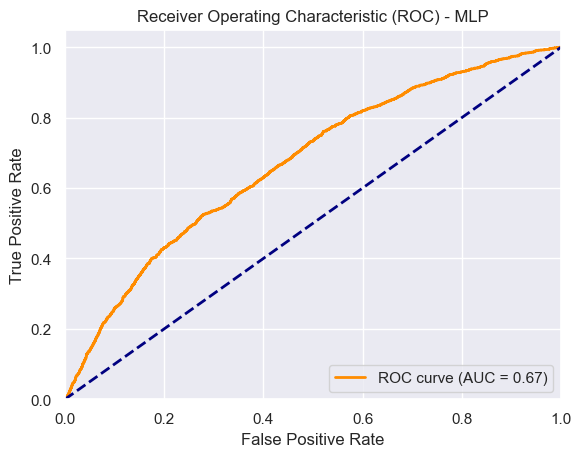

In [119]:
y_val_proba4 = modelMLP_fs.predict_proba(X_val8_fs)[:, 1]

# Compute ROC curve and ROC AUC
fpr_mlp, tpr_mlp, thresholds = roc_curve(y_val_converted4, y_val_proba4)
auc_mlp = roc_auc_score(y_val_converted4, y_val_proba4)

# Plot ROC curve
plt.figure()
plt.plot(fpr_mlp, tpr_mlp, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_mlp)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - MLP')
plt.legend(loc="lower right")
plt.show()


## 10.5 Decision Trees

### 10.5.6 Mininal Cost Complexity Prunning

**with FS**

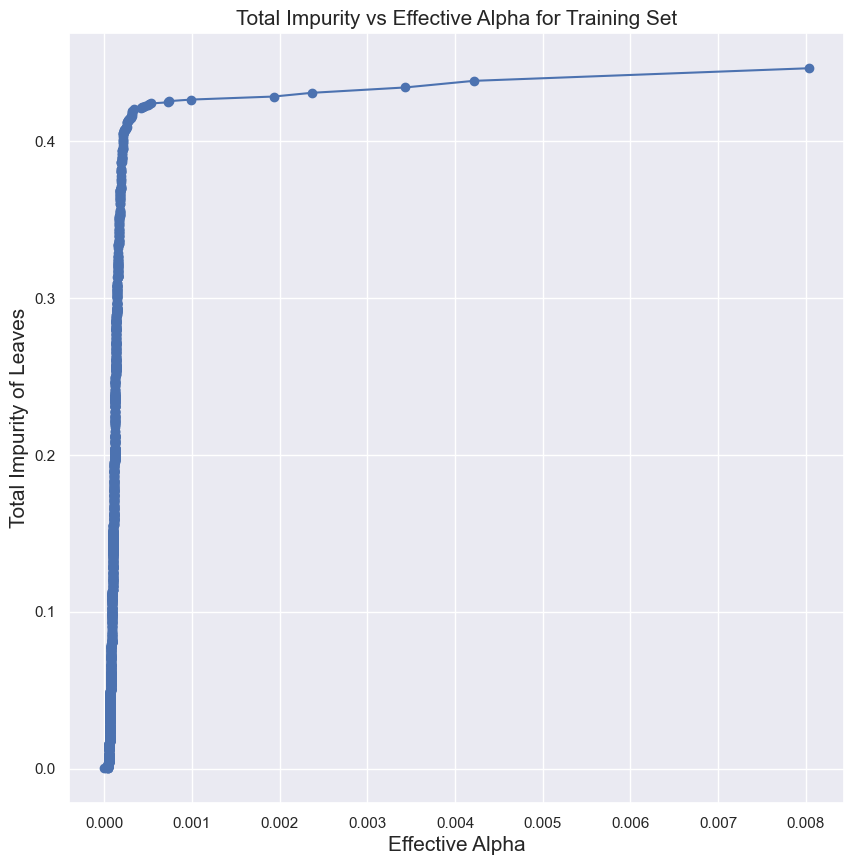

In [120]:
dt_alpha = DecisionTreeClassifier(random_state=42)


path = dt_alpha.cost_complexity_pruning_path(X_undersampled_fs, y_undersampled_fs)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o')  
ax.set_xlabel("Effective Alpha", fontsize=15)
ax.set_ylabel("Total Impurity of Leaves", fontsize=15)
ax.set_title("Total Impurity vs Effective Alpha for Training Set", fontsize=15)
plt.show()


**with FS**

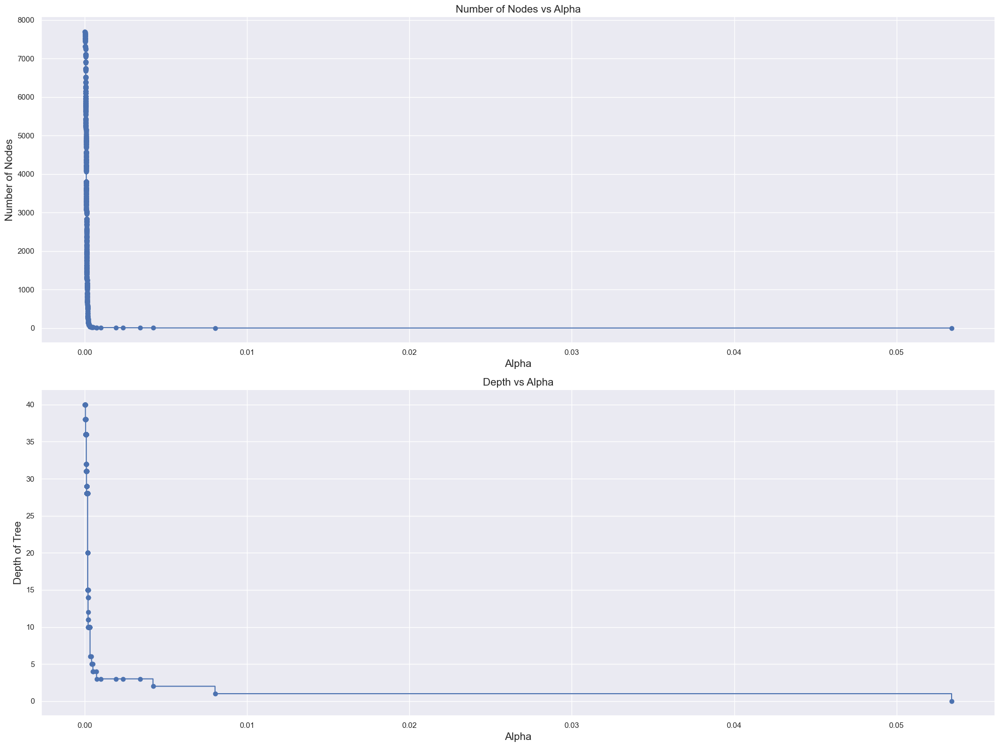

In [121]:
trees = []
for ccp_alpha in ccp_alphas:
    dt_alpha = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha).fit(X_undersampled_fs, y_undersampled_fs)
    trees.append(dt_alpha)


node_counts = [tree.tree_.node_count for tree in trees]
depth = [tree.get_depth() for tree in trees]


fig, ax = plt.subplots(2, 1, figsize=(20, 15))
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("Alpha", fontsize=15)
ax[0].set_ylabel("Number of Nodes", fontsize=15)
ax[0].set_title("Number of Nodes vs Alpha", fontsize=15)

ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("Alpha", fontsize=15)
ax[1].set_ylabel("Depth of Tree", fontsize=15)
ax[1].set_title("Depth vs Alpha", fontsize=15)

fig.tight_layout()
plt.show()


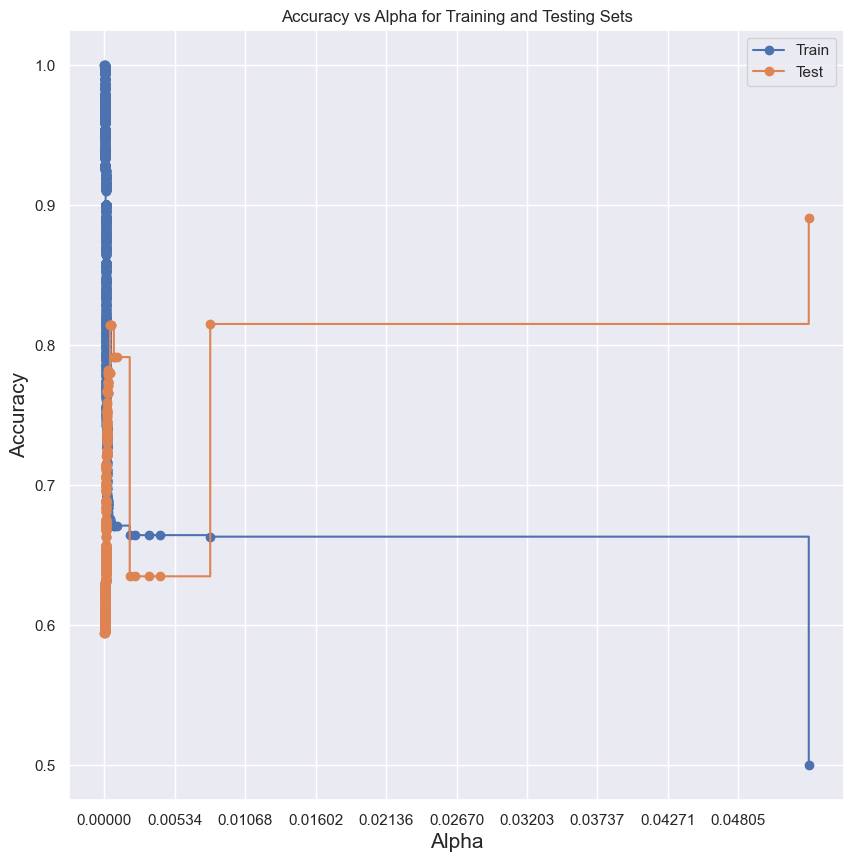

In [122]:
train_scores = [tree.score(X_undersampled_fs, y_undersampled_fs) for tree in trees]
test_scores = [tree.score(X_val8_fs, y_val) for tree in trees]

fig, ax = plt.subplots(figsize=(10, 10))
ax.set_xlabel("Alpha", fontsize=15)
ax.set_ylabel("Accuracy", fontsize=15)
ax.set_title("Accuracy vs Alpha for Training and Testing Sets")

ax.plot(ccp_alphas, train_scores, marker='o', label="Train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="Test", drawstyle="steps-post")

plt.xticks(np.arange(0, max(ccp_alphas), step=max(ccp_alphas)/10)) 
ax.legend()
plt.show()


**with FS**

In [123]:
index_best_model = np.argmax(test_scores)
best_model = trees[index_best_model]
print('ccp_alpha of best model: ',trees[index_best_model])
print('_____________________________________________________________')
print('Training accuracy of best model: ',best_model.score(X_undersampled_fs, y_undersampled_fs))
print('Test accuracy of best model: ',best_model.score(X_val8_fs, y_val))

ccp_alpha of best model:  DecisionTreeClassifier(ccp_alpha=0.053390830306532244, random_state=42)
_____________________________________________________________
Training accuracy of best model:  0.5
Test accuracy of best model:  0.8910022459292533


### 10.5.7 GridSearch

**with FS**

In [124]:

param_grid = {
    'max_depth': [1, 2, 3, 4, 5, 6, 7],
    'min_samples_split': [2, 3, 4, 5, 6, 7],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7 ],
    'max_features': [None, 'auto', 'sqrt', 'log2'],
    'criterion': ['gini'],
    'splitter': ['best'],
    'max_leaf_nodes': [None, 1, 2, 3, 4, 5, 6, 7]
}

model = DecisionTreeClassifier(random_state=42)

grid_search = GridSearchCV(model, param_grid, cv=stratified_k_fold, scoring='f1', verbose=3)

grid_search.fit(X_undersampled_fs, y_undersampled_fs)  

best_parameters = grid_search.best_params_
best_score = grid_search.best_score_

print("Melhores parâmetros:", best_parameters)


Fitting 5 folds for each of 9408 candidates, totalling 47040 fits
[CV 1/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_

In [125]:
modelDT = DecisionTreeClassifier(criterion='gini', max_depth=1,max_features=None, min_samples_leaf = 1, max_leaf_nodes=None, min_samples_split = 2, splitter='best', random_state=42)

# Cross-Validation
scores = cross_val_score(modelDT, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print("Cross-Validation Scores: ", scores)
mean_accuracy_dt_train = scores.mean()
print("Mean Training Accuracy:", mean_accuracy_dt_train)

# Fit the model on the training set
modelDT.fit(X_undersampled_fs, y_undersampled_fs)

# Predicting on training set
y_train_pred = modelDT.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

# Evaluate the Model on Training Set
accuracy_dt_train = accuracy_score(y_train_converted, y_train_pred_converted)
f1_dt_train = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Converted Training Set:")
print("Accuracy:", accuracy_dt_train)
print("F1 Score:", f1_dt_train)
print("\nClassification Report for the Converted Training Set:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting on validation set
y_val_pred = modelDT.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted5 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

# Evaluate the Model on Validation Set
accuracy_dt_val = accuracy_score(y_val_converted5, y_val_pred_converted)
f1_dt_val = f1_score(y_val_converted5, y_val_pred_converted)
confusion_dt_val = confusion_matrix(y_val_converted5, y_val_pred_converted)
classification_rep_dt_val = classification_report(y_val_converted5, y_val_pred_converted)

print("\nPerformance on the Converted Validation Set:")
print("Accuracy:", accuracy_dt_val)
print("F1 Score:", f1_dt_val)
print("\nConfusion Matrix:\n", confusion_dt_val)
print("\nClassification Report:\n", classification_rep_dt_val)


Cross-Validation Scores:  [0.66354045 0.66471278 0.65846034 0.65103556 0.67826427]
Mean Training Accuracy: 0.6632026779420837

Performance on the Converted Training Set:
Accuracy: 0.6632015007034547
F1 Score: 0.6549763792137079

Classification Report for the Converted Training Set:
              precision    recall  f1-score   support

           0       0.66      0.69      0.67      6397
           1       0.67      0.64      0.65      6397

    accuracy                           0.66     12794
   macro avg       0.66      0.66      0.66     12794
weighted avg       0.66      0.66      0.66     12794


Performance on the Converted Validation Set:
Accuracy: 0.8150617630544638
F1 Score: 0.25962348974431015

Confusion Matrix:
 [[11151  1544]
 [ 1091   462]]

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.88      0.89     12695
           1       0.23      0.30      0.26      1553

    accuracy                           0.82  

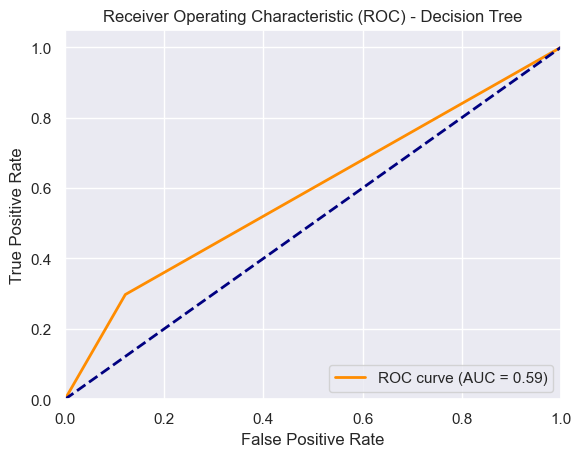

In [126]:
# Predict probabilities on the validation set
y_val_proba5 = modelDT.predict_proba(X_val8_fs)[:, 1]

# Compute ROC curve and ROC AUC
fpr_dt, tpr_dt, thresholds = roc_curve(y_val_converted5, y_val_proba5)
auc_dt = roc_auc_score(y_val_converted5, y_val_proba5)

# Plot ROC curve
plt.figure()
plt.plot(fpr_dt, tpr_dt, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_dt)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Decision Tree')
plt.legend(loc="lower right")
plt.show()


0.6436610911364702 0.5949663904955448 0.9997655150851962 0.6719556041894638 0.6632015007034547
0.7784250421111735 0.8333099382369455 0.6397389107243122 0.7526670409882089 0.8150617630544638


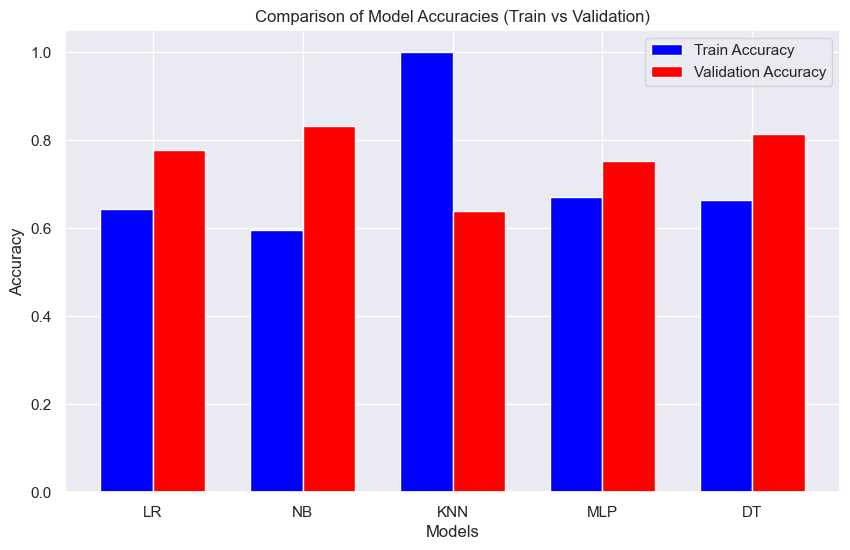

In [127]:
train_accuracies = [accuracy_lr_train_fs, accuracy_nb_train_fs, accuracy_knn_fs_train, accuracy_mlp_fs_train, accuracy_dt_train]
val_accuracies = [accuracy_lr_val_fs, accuracy_nb_val_fs, accuracy_knn_fs_val, accuracy_mlp_fs_val, accuracy_dt_val]
model_names =["LR", "NB", "KNN", "MLP", "DT"]

print(accuracy_lr_train_fs, accuracy_nb_train_fs, accuracy_knn_fs_train, accuracy_mlp_fs_train, accuracy_dt_train)
print(accuracy_lr_val_fs, accuracy_nb_val_fs, accuracy_knn_fs_val, accuracy_mlp_fs_val, accuracy_dt_val)
x = range(len(model_names))
bar_width = 0.35

plt.figure(figsize=(10, 6))
bar_train = plt.bar(x, train_accuracies, width=bar_width, label='Train Accuracy', color='blue')
bar_val = plt.bar([i + bar_width for i in x], val_accuracies, width=bar_width, label='Validation Accuracy', color='red')

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracies (Train vs Validation)')
plt.xticks([i + bar_width / 2 for i in x], model_names)
plt.legend()

plt.show()


0.6044251626898048 0.4406303972366149 0.9997654600891251 0.6793490717396286 0.6549763792137079
0.2055210290504408 0.2101762554040572 0.20848111025443333 0.2796402289452167 0.25962348974431015


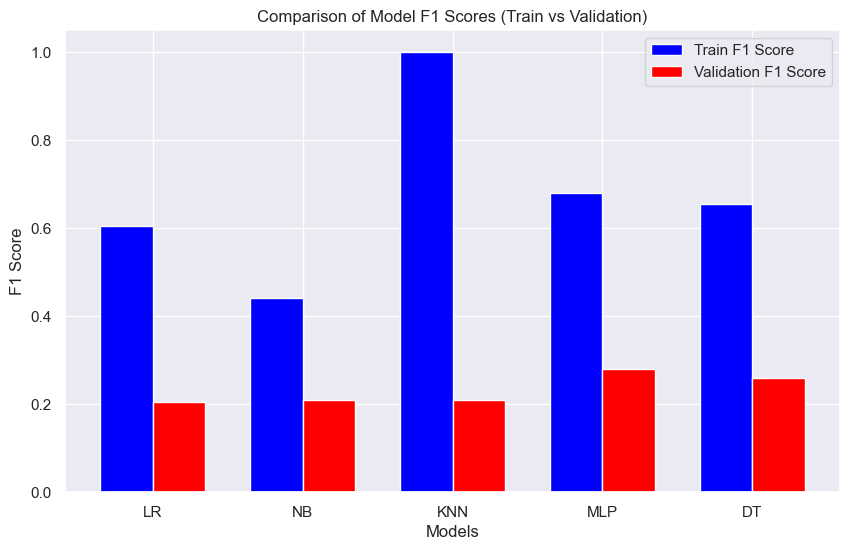

In [128]:
# F1 Scores for each model on the training set
train_f1_scores = [
    f1_lr_train_fs,  # Logistic Regression~
    f1_nb_train_fs,  # Naive Bayes
    f1_knn_fs_train,  # KNN
    f1_mlp_fs_train,  # MLP
    f1_dt_train  # Decision Tree
]

# F1 Scores for each model on the validation set
val_f1_scores = [
    f1_val,  # Logistic Regression
    f1_nb_val_fs,  # Naive Bayes
    f1_knn_fs_val,  # KNN
    f1_mlp_fs_val,  # MLP
    f1_dt_val  # Decision Tree
]

print(
    f1_lr_train_fs,  # Logistic Regression~
    f1_nb_train_fs,  # Naive Bayes
    f1_knn_fs_train,  # KNN
    f1_mlp_fs_train,  # MLP
    f1_dt_train  # Decision Tree
)

print(f1_val,  # Logistic Regression
    f1_nb_val_fs,  # Naive Bayes
    f1_knn_fs_val,  # KNN
    f1_mlp_fs_val,  # MLP
    f1_dt_val  # Decision Tree
)
model_names = ["LR", "NB", "KNN", "MLP", "DT"]
x = range(len(model_names))
bar_width = 0.35

plt.figure(figsize=(10, 6))
bar_train = plt.bar(x, train_f1_scores, width=bar_width, label='Train F1 Score', color='blue')
bar_val = plt.bar([i + bar_width for i in x], val_f1_scores, width=bar_width, label='Validation F1 Score', color='red')

plt.xlabel('Models')
plt.ylabel('F1 Score')
plt.title('Comparison of Model F1 Scores (Train vs Validation)')
plt.xticks([i + bar_width / 2 for i in x], model_names)
plt.legend()

plt.show()


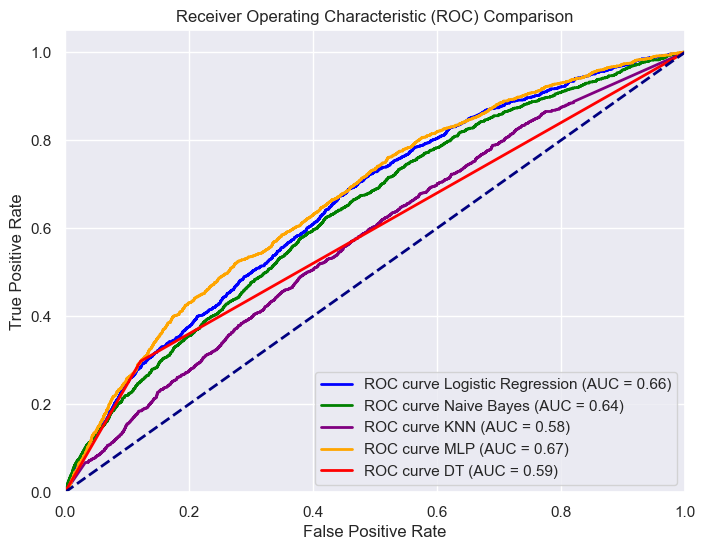

In [129]:
plt.figure(figsize=(8, 6))

plt.plot(fpr_lr, tpr_lr, color='blue', lw=2, label=f'ROC curve Logistic Regression (AUC = {auc_lr:.2f})')
plt.plot(fpr_nb, tpr_nb, color='green', lw=2, label=f'ROC curve Naive Bayes (AUC = {auc_nb:.2f})')
plt.plot(fpr_knn, tpr_knn, color='purple', lw=2, label=f'ROC curve KNN (AUC = {auc_knn:.2f})')
plt.plot(fpr_mlp, tpr_mlp, color='orange', lw=2, label=f'ROC curve MLP (AUC = {auc_mlp:.2f})')
plt.plot(fpr_dt, tpr_dt, color='red', lw=2, label=f'ROC curve DT (AUC = {auc_dt:.2f})')



plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Comparison')
plt.legend(loc="lower right")
plt.show()

# 11.Ensemble

## 11.1 Bagging

### 11.1.1 RandomForestClassifier

In [130]:
max_depth = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]
n_estim = [5,6,7,8,9,10,11]
cc_alpha = [0.0001, 0.001, 0.01, 0.1, 0.0]
bootstrap = [True, False]
f1_scores1 = []
for i in max_depth:
    for j in n_estim:
        for a in cc_alpha:
            for b in bootstrap:
                best_model = RandomForestClassifier(max_depth=i, n_estimators=j, random_state=42, ccp_alpha=a, bootstrap = b)

                
                scores = cross_val_score(best_model, X_train8, y_train, cv=stratified_k_fold, scoring='f1')

                mean_accuracy = scores.mean()
                std_accuracy = scores.std()

                best_model.fit(X_undersampled_fs, y_undersampled_fs)

                y_val_pred = best_model.predict(X_val8_fs)

                y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]

                y_val_converted = [0 if x == 'No' else 1 for x in y_val.to_numpy()]


                accuracy_val = accuracy_score(y_val_converted, y_val_pred_converted)
                confusion_val = confusion_matrix(y_val_converted, y_val_pred_converted)
                classification_rep_val = classification_report(y_val_converted, y_val_pred_converted)
                f1_val = f1_score(y_val_converted, y_val_pred_converted)
                f1_scores1.append([f1_val,i,j,a,b])

In [131]:
f1_a = np.array(f1_scores1)
f1_r1 = [row[0] for row in f1_a]
f1_a[f1_r1.index(max(f1_r1))]

array([2.82403433e-01, 8.00000000e+00, 1.10000000e+01, 1.00000000e-03,
       1.00000000e+00])

In [132]:
# Define the model
best_model = RandomForestClassifier(max_depth=8, n_estimators=11, random_state=42, ccp_alpha=0.0001)

# Perform cross-validation
scores = cross_val_score(best_model, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print("Cross-Validation Scores: ", scores)
mean_f1 = scores.mean()
std_f1 = scores.std()

print("Mean F1 Score (Cross-Validation):", mean_f1)
print("Standard Deviation of F1 Score:", std_f1)

# Fit the model on the training set
best_model.fit(X_undersampled_fs, y_undersampled_fs)

# Predicting on the training set
y_train_pred = best_model.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

# Evaluate the Model on Training Set
accuracy_train = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train1 = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Converted Training Set:")
print("Accuracy:", accuracy_train)
print("F1 Score:", f1_train1)
print("\nClassification Report for the Converted Training Set:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting on the validation set
y_val_pred = best_model.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted7 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

# Evaluate the Model on Validation Set
accuracy_val = accuracy_score(y_val_converted7, y_val_pred_converted)
f1_val1 = f1_score(y_val_converted7, y_val_pred_converted)
confusion_val = confusion_matrix(y_val_converted7, y_val_pred_converted)
classification_rep_val = classification_report(y_val_converted7, y_val_pred_converted)

print("\nPerformance on the Converted Validation Set:")
print("Accuracy:", accuracy_val)
print("F1 Score:", f1_val1)
print("\nConfusion Matrix:\n", confusion_val)
print("\nClassification Report:\n", classification_rep_val)


Cross-Validation Scores:  [0.67409144 0.67213755 0.66822978 0.66393122 0.67787334]
Mean F1 Score (Cross-Validation): 0.6712526669275924
Standard Deviation of F1 Score: 0.004804505432504301

Performance on the Converted Training Set:
Accuracy: 0.6922776301391277
F1 Score: 0.6967105769971498

Classification Report for the Converted Training Set:
              precision    recall  f1-score   support

           0       0.70      0.68      0.69      6397
           1       0.69      0.71      0.70      6397

    accuracy                           0.69     12794
   macro avg       0.69      0.69      0.69     12794
weighted avg       0.69      0.69      0.69     12794


Performance on the Converted Validation Set:
Accuracy: 0.75414093206064
F1 Score: 0.27519139250982827

Confusion Matrix:
 [[10080  2615]
 [  888   665]]

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.79      0.85     12695
           1       0.20      0.43      

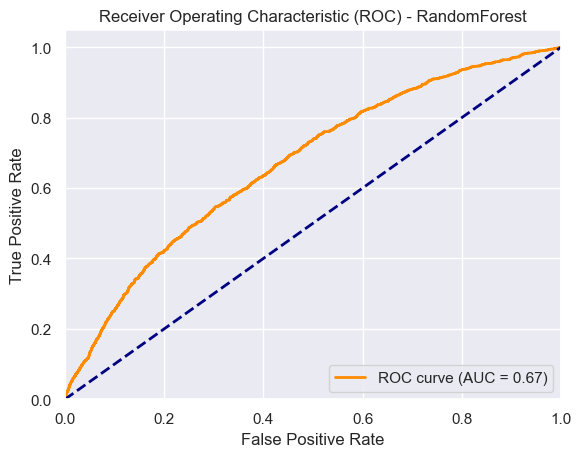

In [133]:
# Predict probabilities on the validation set
y_val_proba7 = best_model.predict_proba(X_val8_fs)[:, 1]

# Compute ROC curve and ROC AUC
fpr_rf, tpr_rf, thresholds = roc_curve(y_val_converted7, y_val_proba7)
auc_rf = roc_auc_score(y_val_converted7, y_val_proba7)

# Plot ROC curve
plt.figure()
plt.plot(fpr_rf, tpr_rf, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_rf)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - RandomForest')
plt.legend(loc="lower right")
plt.show()


### 11.1.2 Bagging Classifier

In [134]:
def return_results(models,names, x_t,y_t, x_v,y_v):
    results= []
    i = 0
    maxi = 0
    save = 0
    for model in models:
        model.fit(x_t, y_t)
        y_v_p = model.predict(x_v)
        y_val_pred_converted = [0 if x == 'No' else 1 for x in y_v_p]
        y_val_converted = [0 if x == 'No' else 1 for x in y_v.to_numpy()]
        scores = f1_score(y_val_converted, y_val_pred_converted)
        results.append(scores)
        if maxi< scores:
            maxi = scores
            save = i
        i+=1
    print(maxi, names[save])

In [135]:
def get_models(estimator, max_samples, max_features, bootstrap):
    models = []
    names = []
    for e in estimator:
        for ms in max_samples:
            for mf in max_features:
                for b in bootstrap:
                    models.append(BaggingClassifier(estimator = e, max_samples=ms, max_features = mf, bootstrap = b , random_state = 42))
                    names.append([e, ms, mf, b])
    return models,names

In [136]:
estimator =[DecisionTreeClassifier(), KNeighborsClassifier(), None ]
max_samples = [0.1,0.2,0.4,0.6,0.8,1.0]
max_features = [0.1,0.2,0.4,0.6,0.8,1.0]
bootstrap = [True, False]
models, n = get_models(estimator, max_samples, max_features, bootstrap)
return_results(models,n,X_undersampled_fs, y_undersampled_fs,X_val8_fs,y_val)

0.24972972972972973 [DecisionTreeClassifier(), 1.0, 0.2, False]


In [137]:


# Create the Bagging Classifier with specified parameters
base_estimator = DecisionTreeClassifier()  # Decision Tree as base estimator
bagging_model = BaggingClassifier(
    base_estimator=base_estimator,
    max_samples=1.0,       # 10% of the training set
    max_features=0.2,      # 10% of the features
    bootstrap=False,       # Without replacement
    random_state=42
)

# Fit the model on the undersampled training set
bagging_model.fit(X_undersampled_fs, y_undersampled_fs)

# Convert labels to binary format
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]
y_val_converted8 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

# Predict and evaluate on the training set
y_train_pred = bagging_model.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
accuracy_train_bagging = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train_bagging = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Training Set (BaggingClassifier):")
print("Training Set Accuracy:", accuracy_train_bagging)
print("Training Set F1 Score:", f1_train_bagging)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predict and evaluate on the validation set
y_val_pred = bagging_model.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
accuracy_val_bagging = accuracy_score(y_val_converted8, y_val_pred_converted)
f1_val_bagging = f1_score(y_val_converted8, y_val_pred_converted)

print("\nPerformance on the Validation Set (BaggingClassifier):")
print("Validation Set Accuracy:", accuracy_val_bagging)
print("Validation Set F1 Score:", f1_val_bagging)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted8, y_val_pred_converted))

# Cross-validation scores
scores_bagging = cross_val_score(bagging_model, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
mean_accuracy_bagging = scores_bagging.mean()
std_accuracy_bagging = scores_bagging.std()

print("Cross-Validation Scores (BaggingClassifier):", scores_bagging)
print("Mean Cross-Validation Accuracy:", mean_accuracy_bagging)
print("Standard Deviation of Cross-Validation Accuracy:", std_accuracy_bagging)



Performance on the Training Set (BaggingClassifier):
Training Set Accuracy: 0.7596529623260904
Training Set F1 Score: 0.7463917525773196

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.81      0.77      6397
           1       0.79      0.71      0.75      6397

    accuracy                           0.76     12794
   macro avg       0.76      0.76      0.76     12794
weighted avg       0.76      0.76      0.76     12794


Performance on the Validation Set (BaggingClassifier):
Validation Set Accuracy: 0.7077484559236384
Validation Set F1 Score: 0.24972972972972973

Validation Set Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.74      0.82     12695
           1       0.17      0.45      0.25      1553

    accuracy                           0.71     14248
   macro avg       0.54      0.59      0.53     14248
weighted avg       0.84      0.71      0.7

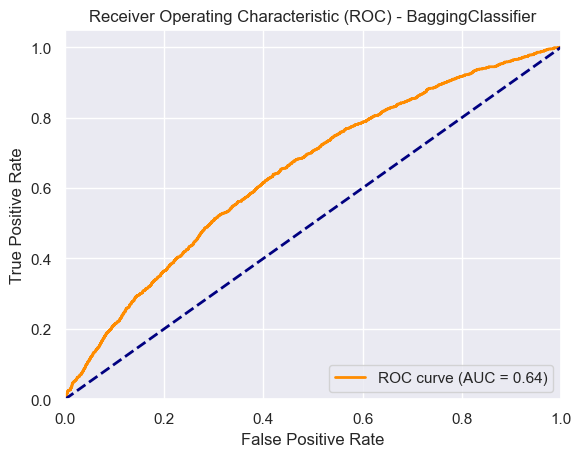

In [138]:
y_val_proba8 = bagging_model.predict_proba(X_val8_fs)[:, 1]


# Compute ROC curve and ROC AUC
fpr_bagging, tpr_bagging, thresholds = roc_curve(y_val_converted8, y_val_proba8)
auc_bagging = roc_auc_score(y_val_converted8, y_val_proba8)

# Plot ROC curve
plt.figure()
plt.plot(fpr_bagging, tpr_bagging, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_bagging)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - BaggingClassifier')
plt.legend(loc="lower right")
plt.show()


## 11.2 Boosting

### 11.2.1 GradientBoostingClassifier

In [139]:
learning_rate = [0.001, 0.01, 0.1, 0.3, 0.5, 0.8, 1.0]
n_estimators = [2,5,10,20,30,50,100,150,200,500]
sub_sample = [0.2,0.4,0.6,0.8,1.0]
max_features = [None]

max_f1 = 0
values=''
for i in learning_rate:
    for j in n_estimators:
        for s in sub_sample:
            for m in max_features:
        
                gb= GradientBoostingClassifier(n_estimators=j, learning_rate=i,subsample = s,max_features =m, random_state=42)

                gb.fit(X_undersampled_fs, y_undersampled_fs)

                y_val_pred = gb.predict(X_val8_fs)

                y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]

                y_val_converted = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

                f1_val = f1_score(y_val_converted, y_val_pred_converted)
                
                if max_f1 < f1_val:
                    max_f1 = f1_val
                    values = 'learning rate ' + str(i), ' n_stimators '+ str(j)+ ' sub sample ' + str(s)+ ' max_features'+str(m) 

In [140]:
print(values,'f1_Score:', max_f1)

('learning rate 0.01', ' n_stimators 500 sub sample 0.6 max_featuresNone') f1_Score: 0.2866255581543696


In [141]:
# Boosting ensemble
best_boosting_ensemble = GradientBoostingClassifier(n_estimators=500, learning_rate=0.01,subsample = 0.6,max_features =None, random_state=42)

best_boosting_ensemble.fit(X_undersampled_fs, y_undersampled_fs)
# Perform cross-validation
scores_boosting = cross_val_score(best_boosting_ensemble, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print("Cross-Validation Scores: ", scores_boosting)
mean_accuracy_boosting_train = scores_boosting.mean()
std_accuracy_boosting = scores_boosting.std()

print("Cross-Validation Scores (GradientBoostingClassifier):", scores_boosting)
print("Mean Training Accuracy:", mean_accuracy_boosting_train)
print("Standard Deviation of Training Accuracy:", std_accuracy_boosting)

# Predict on the training set
y_train_pred_boosting = best_boosting_ensemble.predict(X_undersampled_fs)

# Convert predictions to binary if necessary (assuming y_undersampled_fs is in 'Yes/No' format)
y_train_pred_converted_boosting = [0 if x == 'No' else 1 for x in y_train_pred_boosting]
y_train_converted_boosting = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

# Evaluate the model on the training set
accuracy_train_boosting = accuracy_score(y_train_converted_boosting, y_train_pred_converted_boosting)
f1_train_boosting = f1_score(y_train_converted_boosting, y_train_pred_converted_boosting)

print("\nPerformance on the Training Set (GradientBoostingClassifier):")
print("Training Set Accuracy:", accuracy_train_boosting)
print("Training Set F1 Score:", f1_train_boosting)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted_boosting, y_train_pred_converted_boosting))

# Predict on the validation set
y_val_pred_boosting = best_boosting_ensemble.predict(X_val8_fs)

# Convert predictions to binary if necessary (assuming y_val is in 'Yes/No' format)
y_val_pred_converted_boosting = [0 if x == 'No' else 1 for x in y_val_pred_boosting]
y_val_converted9 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

# Evaluate the model on the validation set
accuracy_val_boosting = accuracy_score(y_val_converted9, y_val_pred_converted_boosting)
f1_val_boosting = f1_score(y_val_converted9, y_val_pred_converted_boosting)

print("\nPerformance on the Validation Set (GradientBoostingClassifier):")
print("Validation Set Accuracy:", accuracy_val_boosting)
print("Validation Set F1 Score:", f1_val_boosting)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted9, y_val_pred_converted_boosting))


Cross-Validation Scores:  [0.67721766 0.67917155 0.67174678 0.65611567 0.68608288]
Cross-Validation Scores (GradientBoostingClassifier): [0.67721766 0.67917155 0.67174678 0.65611567 0.68608288]
Mean Training Accuracy: 0.6740669076105703
Standard Deviation of Training Accuracy: 0.010079663787387779

Performance on the Training Set (GradientBoostingClassifier):
Training Set Accuracy: 0.6778958886978271
Training Set F1 Score: 0.6815547484738428

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.67      0.67      6397
           1       0.67      0.69      0.68      6397

    accuracy                           0.68     12794
   macro avg       0.68      0.68      0.68     12794
weighted avg       0.68      0.68      0.68     12794


Performance on the Validation Set (GradientBoostingClassifier):
Validation Set Accuracy: 0.764528354856822
Validation Set F1 Score: 0.2866255581543696

Validation Set Classification Report:

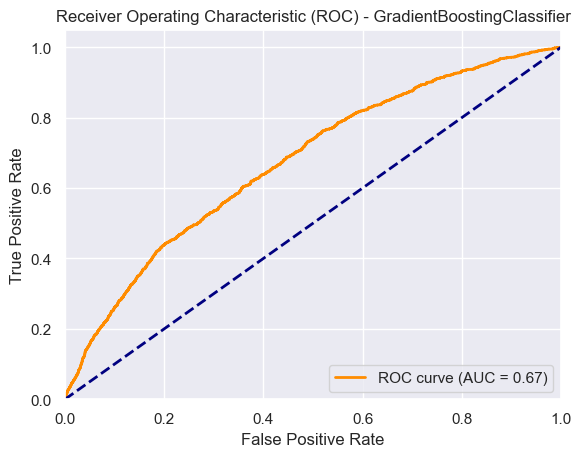

In [142]:
# Predict probabilities on the validation set
y_val_proba9 = best_boosting_ensemble.predict_proba(X_val8_fs)[:, 1]

# Compute ROC curve and ROC AUC
fpr_boosting, tpr_boosting, thresholds = roc_curve(y_val_converted9, y_val_proba9)
auc_boosting = roc_auc_score(y_val_converted9, y_val_proba9)

# Plot ROC curve
plt.figure()
plt.plot(fpr_boosting, tpr_boosting, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_boosting)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - GradientBoostingClassifier')
plt.legend(loc="lower right")
plt.show()


### 11.2.2 AdaBoost

In [143]:

y_undersampled_fs_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs]
y_val_converted10 = [0 if x == 'No' else 1 for x in y_val]

# Define the base estimator
base_estimator = DecisionTreeClassifier()

# Define the AdaBoost classifier
ada_boost = AdaBoostClassifier(base_estimator=base_estimator, random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1],
    'base_estimator__max_depth': [1, 2, 3]
}

# Set up GridSearchCV
grid_search = GridSearchCV(ada_boost, param_grid, cv=stratified_k_fold, scoring='f1')
grid_search.fit(X_undersampled_fs, y_undersampled_fs_converted)
best_ada_boost = grid_search.best_estimator_
print("Best parameters found: ", grid_search.best_params_)

# Cross-validation on the training set
cv_scores_train = cross_val_score(best_ada_boost, X_undersampled_fs, y_undersampled_fs_converted, cv=stratified_k_fold, scoring='f1')
mean_cv_score_train = cv_scores_train.mean()
std_cv_score_train = cv_scores_train.std()
print("\nCross-Validation Scores on Training Set (F1 Score):", cv_scores_train)
print("Mean F1 Score (Training):", mean_cv_score_train)
print("Standard Deviation of F1 Score (Training):", std_cv_score_train)

# Fit the model on the entire training set
best_ada_boost.fit(X_undersampled_fs, y_undersampled_fs_converted)

# Evaluate on the training set
y_train_pred = best_ada_boost.predict(X_undersampled_fs)
accuracy_train2 = accuracy_score(y_undersampled_fs_converted, y_train_pred)
f1_train = f1_score(y_undersampled_fs_converted, y_train_pred)
print("\nPerformance on the Training Set:")
print("Training Set Accuracy:", accuracy_train2)
print("Training Set F1 Score:", f1_train)
print("\nTraining Set Classification Report:")
print(classification_report(y_undersampled_fs_converted, y_train_pred))

# Evaluate on the validation set
y_val_pred = best_ada_boost.predict(X_val8_fs)
accuracy_val_ada = accuracy_score(y_val_converted10, y_val_pred)
f1_val_ada = f1_score(y_val_converted10, y_val_pred)
print("\nPerformance on the Validation Set:")
print("Validation Set Accuracy:", accuracy_val_ada)
print("Validation Set F1 Score:", f1_val_ada)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted10, y_val_pred))


Best parameters found:  {'base_estimator__max_depth': 3, 'learning_rate': 0.01, 'n_estimators': 100}

Cross-Validation Scores on Training Set (F1 Score): [0.67953668 0.68086754 0.67810831 0.66385265 0.68920476]
Mean F1 Score (Training): 0.6783139899619728
Standard Deviation of F1 Score (Training): 0.00819508737721576

Performance on the Training Set:
Training Set Accuracy: 0.6735969985930905
Training Set F1 Score: 0.6794104099493321

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.66      0.67      6397
           1       0.67      0.69      0.68      6397

    accuracy                           0.67     12794
   macro avg       0.67      0.67      0.67     12794
weighted avg       0.67      0.67      0.67     12794


Performance on the Validation Set:
Validation Set Accuracy: 0.7554042672655812
Validation Set F1 Score: 0.2798098780739822

Validation Set Classification Report:
              precision    recall  f

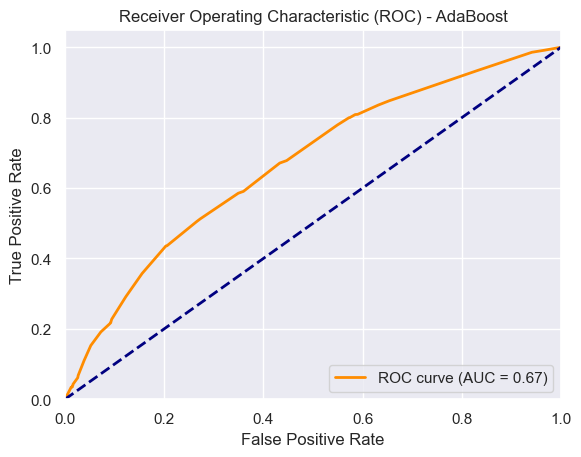

In [144]:
# Predict probabilities on the validation set
y_val_proba10 = best_ada_boost.predict_proba(X_val8_fs)[:, 1]

# Compute ROC curve and ROC AUC
fpr_ada, tpr_ada, thresholds = roc_curve(y_val_converted10, y_val_proba10)
auc_ada = roc_auc_score(y_val_converted10, y_val_proba10)

# Plot ROC curve
plt.figure()
plt.plot(fpr_ada, tpr_ada, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_ada)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - AdaBoost')
plt.legend(loc="lower right")
plt.show()


## 11.3 Stacking

In [145]:
estimators = [
    ('lg', LogisticRegression(random_state=42)),
    ('gb', GradientBoostingClassifier(n_estimators=50, learning_rate=0.1,subsample = 0.6,max_features =None, random_state=42))
]
meta_estimator = LogisticRegression(random_state=42)

# Perform cross-validation
scores = cross_val_score(meta_estimator, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
mean_accuracy_ensemble_train1 = scores.mean()

print("Cross-Validation Scores: ", scores)
print("Mean Training Accuracy:", mean_accuracy_ensemble_train1)

# Create and fit the stacking classifier
stacking = StackingClassifier(estimators=estimators, final_estimator=meta_estimator)
stacking.fit(X_undersampled_fs, y_undersampled_fs)

# Predicting and evaluating on training set
y_train_pred = stacking.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

accuracy_train3 = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train2 = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_train3)
print("Training Set F1 Score:", f1_train2)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting and evaluating on validation set
y_val_pred = stacking.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted11 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

accuracy_val1 = accuracy_score(y_val_converted11, y_val_pred_converted)
f1_val2 = f1_score(y_val_converted11, y_val_pred_converted)

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_val1)
print("Validation Set F1 Score:", f1_val2)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted11, y_val_pred_converted))

# Confusion Matrix for Validation Set
conf_matrix_val = confusion_matrix(y_val_converted11, y_val_pred_converted)
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)


Cross-Validation Scores:  [0.63931223 0.65416178 0.65494334 0.62602579 0.63604378]
Mean Training Accuracy: 0.6420973852117394

Performance on the Converted Training Set:
Training Set Accuracy: 0.6775050805064874
Training Set F1 Score: 0.68015503875969

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.67      0.67      6397
           1       0.67      0.69      0.68      6397

    accuracy                           0.68     12794
   macro avg       0.68      0.68      0.68     12794
weighted avg       0.68      0.68      0.68     12794


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.76614261650758
Validation Set F1 Score: 0.28650963597430407

Validation Set Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.81      0.86     12695
           1       0.21      0.43      0.29      1553

    accuracy                           0.77     

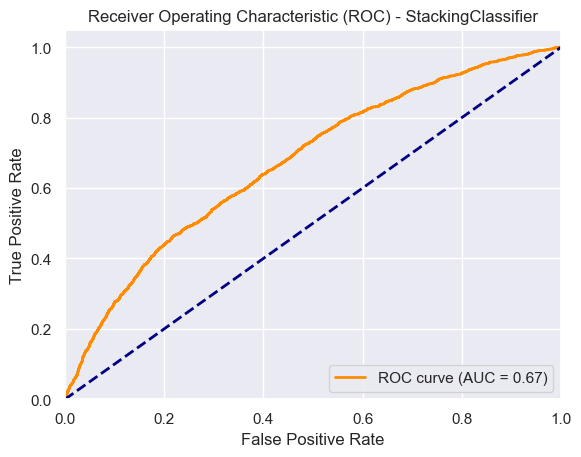

In [146]:
# Predict probabilities on the validation set
y_val_proba11 = stacking.predict_proba(X_val8_fs)[:, 1]

# Compute ROC curve and ROC AUC
fpr_stacking, tpr_stacking, thresholds = roc_curve(y_val_converted11, y_val_proba11)
auc_stacking = roc_auc_score(y_val_converted11, y_val_proba11)

# Plot ROC curve
plt.figure()
plt.plot(fpr_stacking, tpr_stacking, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_stacking)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - StackingClassifier')
plt.legend(loc="lower right")
plt.show()


In [147]:
estimators = [
    ('NB', GaussianNB(var_smoothing=0.0001)),
    ('gb', GradientBoostingClassifier(n_estimators=50, learning_rate=0.1,subsample = 0.6,max_features =None, random_state=42))
]
meta_estimator = GradientBoostingClassifier(n_estimators=50, learning_rate=0.1,subsample = 0.6,max_features =None, random_state=42)

# Perform cross-validation
scores = cross_val_score(meta_estimator, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print("Cross-Validation Scores: ", scores)
mean_accuracy_ensemble_train2 = scores.mean()

print("Mean Training Accuracy:", mean_accuracy_ensemble_train2)

# Create and fit the stacking classifier
stacking1 = StackingClassifier(estimators=estimators, final_estimator=meta_estimator)
stacking1.fit(X_undersampled_fs, y_undersampled_fs)

# Predicting and evaluating on training set
y_train_pred = stacking1.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

accuracy_train4 = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train3 = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_train4)
print("Training Set F1 Score:", f1_train3)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting and evaluating on validation set
y_val_pred = stacking1.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted12 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

accuracy_val2 = accuracy_score(y_val_converted12, y_val_pred_converted)
f1_val3 = f1_score(y_val_converted12, y_val_pred_converted)

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_val2)
print("Validation Set F1 Score:", f1_val3)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted12, y_val_pred_converted))

# Confusion Matrix for Validation Set
conf_matrix_val = confusion_matrix(y_val_converted12, y_val_pred_converted)
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)


Cross-Validation Scores:  [0.67370066 0.67526377 0.67018367 0.65572489 0.68491009]
Mean Training Accuracy: 0.6719566166538495

Performance on the Converted Training Set:
Training Set Accuracy: 0.6800062529310614
Training Set F1 Score: 0.6807050382155669

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.68      0.68      6397
           1       0.68      0.68      0.68      6397

    accuracy                           0.68     12794
   macro avg       0.68      0.68      0.68     12794
weighted avg       0.68      0.68      0.68     12794


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.7659320606400898
Validation Set F1 Score: 0.2878496690155883

Validation Set Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.81      0.86     12695
           1       0.22      0.43      0.29      1553

    accuracy                           0.77  

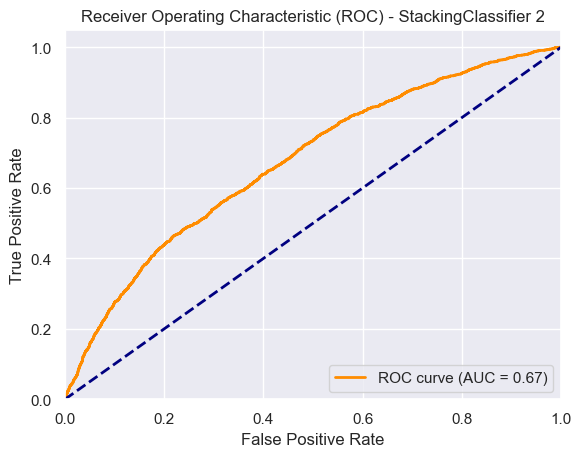

In [148]:
# Predict probabilities on the validation set
y_val_proba12 = stacking.predict_proba(X_val8_fs)[:, 1]


# Compute ROC curve and ROC AUC
fpr_stacking2, tpr_stacking2, thresholds = roc_curve(y_val_converted12, y_val_proba12)
auc_stacking2 = roc_auc_score(y_val_converted12, y_val_proba12)

# Plot ROC curve
plt.figure()
plt.plot(fpr_stacking2, tpr_stacking2, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_stacking2)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - StackingClassifier 2')
plt.legend(loc="lower right")
plt.show()


In [149]:
estimators = [
    ('NB', GaussianNB(var_smoothing=0.0001)),
    ('gb', RandomForestClassifier(max_depth=11, n_estimators=8, random_state=42, ccp_alpha=0.0001))
]
meta_estimator = RandomForestClassifier(max_depth=11, n_estimators=8, random_state=42, ccp_alpha=0.0001)

# Perform cross-validation
scores = cross_val_score(meta_estimator, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
mean_accuracy_ensemble_train3 = scores.mean()
print("Cross-Validation Scores: ", scores)

print("Mean Training Accuracy:", mean_accuracy_ensemble_train3)

# Create and fit the stacking classifier
stacking2 = StackingClassifier(estimators=estimators, final_estimator=meta_estimator)
stacking2.fit(X_undersampled_fs, y_undersampled_fs)

# Predicting and evaluating on training set
y_train_pred = stacking2.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

accuracy_train5 = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train4 = f1_score(y_train_converted, y_train_pred_converted)

print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_train5)
print("Training Set F1 Score:", f1_train4)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_converted, y_train_pred_converted))

# Predicting and evaluating on validation set
y_val_pred = stacking2.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted13 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

accuracy_val3 = accuracy_score(y_val_converted13, y_val_pred_converted)
f1_val4 = f1_score(y_val_converted13, y_val_pred_converted)

print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_val3)
print("Validation Set F1 Score:", f1_val4)
print("\nValidation Set Classification Report:")
print(classification_report(y_val_converted13, y_val_pred_converted))

# Confusion Matrix for Validation Set
conf_matrix_val = confusion_matrix(y_val_converted13, y_val_pred_converted)
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)


Cross-Validation Scores:  [0.66275889 0.66666667 0.66822978 0.65298945 0.66536357]
Mean Training Accuracy: 0.6632016696807569

Performance on the Converted Training Set:
Training Set Accuracy: 0.7056432702829452
Training Set F1 Score: 0.7049514258853025

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.71      0.71      6397
           1       0.71      0.70      0.70      6397

    accuracy                           0.71     12794
   macro avg       0.71      0.71      0.71     12794
weighted avg       0.71      0.71      0.71     12794


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.7253649635036497
Validation Set F1 Score: 0.26127996979422313

Validation Set Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.76      0.83     12695
           1       0.18      0.45      0.26      1553

    accuracy                           0.73 

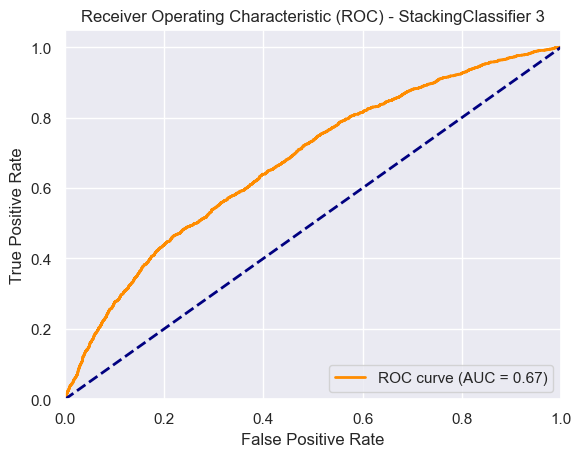

In [150]:
y_val_proba13 = stacking.predict_proba(X_val8_fs)[:, 1]

# Compute ROC curve and ROC AUC
fpr_stacking3, tpr_stacking3, thresholds = roc_curve(y_val_converted13, y_val_proba13)
auc_stacking3 = roc_auc_score(y_val_converted13, y_val_proba13)

# Plot ROC curve
plt.figure()
plt.plot(fpr_stacking3, tpr_stacking3, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_stacking3)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - StackingClassifier 3')
plt.legend(loc="lower right")
plt.show()


## 11.4 Voting

In [151]:
# Adjust class weights in Logistic Regression
lr = LogisticRegression(random_state=42, class_weight={0:1, 1:3}) # Adjust the ratio as needed

# Hyperparameter Tuning for RandomForest
param_grid = {'n_estimators': [50, 100, 150]}
grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=stratified_k_fold, scoring='f1')
grid_search.fit(X_undersampled_fs, y_undersampled_fs)
rf_best = grid_search.best_estimator_

# Gradient Boosting Classifier
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Ensemble Model: Voting Classifier
ensemble = VotingClassifier(estimators=[
    ('rf', rf_best), ('gb', gb), ('lr', lr)],
    voting='soft')


# Perform cross-validation
scores = cross_val_score(ensemble, X_undersampled_fs, y_undersampled_fs, cv=stratified_k_fold, scoring='accuracy')
print("Cross-Validation Scores:", scores)

mean_accuracy_ensemble_train4 = scores.mean()
std_accuracy = scores.std()

print("Mean Training Accuracy:", mean_accuracy_ensemble_train4)
print("Standard Deviation of Training Accuracy:", std_accuracy)

# Fit the model
ensemble.fit(X_undersampled_fs, y_undersampled_fs)

# Predict on training set
y_train_pred = ensemble.predict(X_undersampled_fs)
y_train_pred_converted = [0 if x == 'No' else 1 for x in y_train_pred]
y_train_converted = [0 if x == 'No' else 1 for x in y_undersampled_fs.to_numpy()]

# Evaluate the model on the converted training set
accuracy_train6 = accuracy_score(y_train_converted, y_train_pred_converted)
f1_train5 = f1_score(y_train_converted, y_train_pred_converted)

# Print the results for the training set
print("\nPerformance on the Converted Training Set:")
print("Training Set Accuracy:", accuracy_train6)
print("Training Set F1 Score:", f1_train5)

# Print the confusion matrix for the converted training set
conf_matrix_train = confusion_matrix(y_train_converted, y_train_pred_converted)
print("\nConfusion Matrix for the Converted Training Set:")
print(conf_matrix_train)

# Print the classification report for the converted training set
print("\nClassification Report for the Converted Training Set:")
print(classification_report(y_train_converted, y_train_pred_converted))



# Predict on validation set
y_val_pred = ensemble.predict(X_val8_fs)
y_val_pred_converted = [0 if x == 'No' else 1 for x in y_val_pred]
y_val_converted14 = [0 if x == 'No' else 1 for x in y_val.to_numpy()]

# Evaluate the model on the converted validation set
accuracy_ensemble_val4 = accuracy_score(y_val_converted14, y_val_pred_converted)
f1_val5 = f1_score(y_val_converted14, y_val_pred_converted)

# Print the results for the validation set
print("\nPerformance on the Converted Validation Set:")
print("Validation Set Accuracy:", accuracy_ensemble_val4)
print("Validation Set F1 Score:", f1_val5)

# Print the confusion matrix for the converted validation set
conf_matrix_val = confusion_matrix(y_val_converted14, y_val_pred_converted)
print("\nConfusion Matrix for the Converted Validation Set:")
print(conf_matrix_val)

# Print the classification report for the converted validation set
print("\nClassification Report for the Converted Validation Set:")
print(classification_report(y_val_converted14, y_val_pred_converted))

Cross-Validation Scores: [0.66236811 0.66119578 0.65298945 0.64361079 0.65285379]
Mean Training Accuracy: 0.6546035837273954
Standard Deviation of Training Accuracy: 0.006786070582793694

Performance on the Converted Training Set:
Training Set Accuracy: 0.8587619196498358
Training Set F1 Score: 0.8741380511248867

Confusion Matrix for the Converted Training Set:
[[4712 1685]
 [ 122 6275]]

Classification Report for the Converted Training Set:
              precision    recall  f1-score   support

           0       0.97      0.74      0.84      6397
           1       0.79      0.98      0.87      6397

    accuracy                           0.86     12794
   macro avg       0.88      0.86      0.86     12794
weighted avg       0.88      0.86      0.86     12794


Performance on the Converted Validation Set:
Validation Set Accuracy: 0.6002947782144863
Validation Set F1 Score: 0.2575935340894277

Confusion Matrix for the Converted Validation Set:
[[7565 5130]
 [ 565  988]]

Classificati

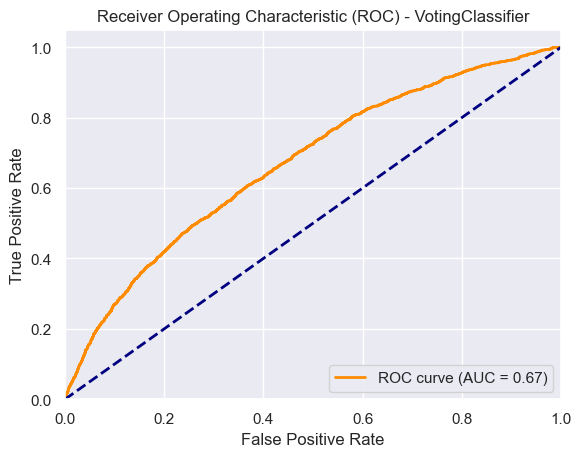

In [152]:
# Predict probabilities on the validation set
y_val_proba14 = ensemble.predict_proba(X_val8_fs)[:, 1]

# Compute ROC curve and ROC AUC
fpr_ensemble, tpr_ensemble, thresholds = roc_curve(y_val_converted14, y_val_proba14)
auc_ensemble = roc_auc_score(y_val_converted14, y_val_proba14)

# Plot ROC curve
plt.figure()
plt.plot(fpr_ensemble, tpr_ensemble, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % auc_ensemble)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - VotingClassifier')
plt.legend(loc="lower right")
plt.show()


## 11.5 Accuracy Table

Training Accuracies: [0.6922776301391277, 0.7596529623260904, 0.6778958886978271, 0.6735969985930905, 0.6775050805064874, 0.6800062529310614, 0.7056432702829452, 0.8587619196498358]
Validation Accuracies: [0.75414093206064, 0.7077484559236384, 0.764528354856822, 0.7554042672655812, 0.76614261650758, 0.7659320606400898, 0.7253649635036497, 0.6002947782144863]


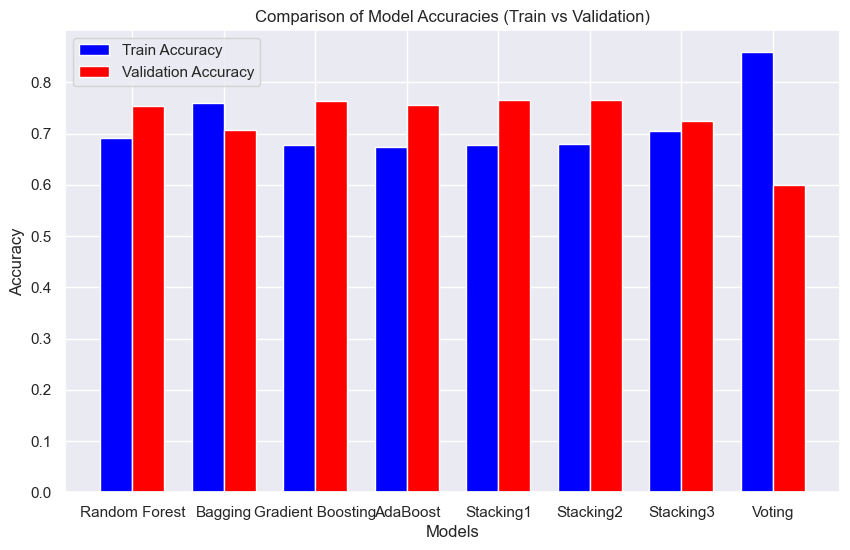

In [153]:
import matplotlib.pyplot as plt

# Training and validation accuracies
train_accuracies = [accuracy_train, accuracy_train_bagging, accuracy_train_boosting, accuracy_train2, accuracy_train3, accuracy_train4, accuracy_train5, accuracy_train6]
val_accuracies = [accuracy_val, accuracy_val_bagging, accuracy_val_boosting, accuracy_val_ada, accuracy_val1, accuracy_val2, accuracy_val3, accuracy_ensemble_val4]

print("Training Accuracies:", train_accuracies)
print("Validation Accuracies:", val_accuracies)
model_names = ["Random Forest", "Bagging", "Gradient Boosting", "AdaBoost", "Stacking1", "Stacking2", "Stacking3", "Voting"]

# Plotting
x = range(len(model_names))
bar_width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x, train_accuracies, width=bar_width, label='Train Accuracy', color='blue')
plt.bar([i + bar_width for i in x], val_accuracies, width=bar_width, label='Validation Accuracy', color='red')

# Adjusting y-axis scale
max_accuracy = max(max(train_accuracies), max(val_accuracies))
yticks = np.arange(0, max_accuracy + 0.01, 0.1)
plt.yticks(yticks)

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracies (Train vs Validation)')
plt.xticks([i + bar_width / 2 for i in x], model_names)
plt.legend()

plt.show()


## 11.6 F1 Table

Training F1: [0.6967105769971498, 0.7463917525773196, 0.6815547484738428, 0.6794104099493321, 0.68015503875969, 0.6807050382155669, 0.7049514258853025, 0.8741380511248867]
Validation F1: [0.27519139250982827, 0.24972972972972973, 0.2866255581543696, 0.2798098780739822, 0.28650963597430407, 0.2878496690155883, 0.26127996979422313, 0.2575935340894277]


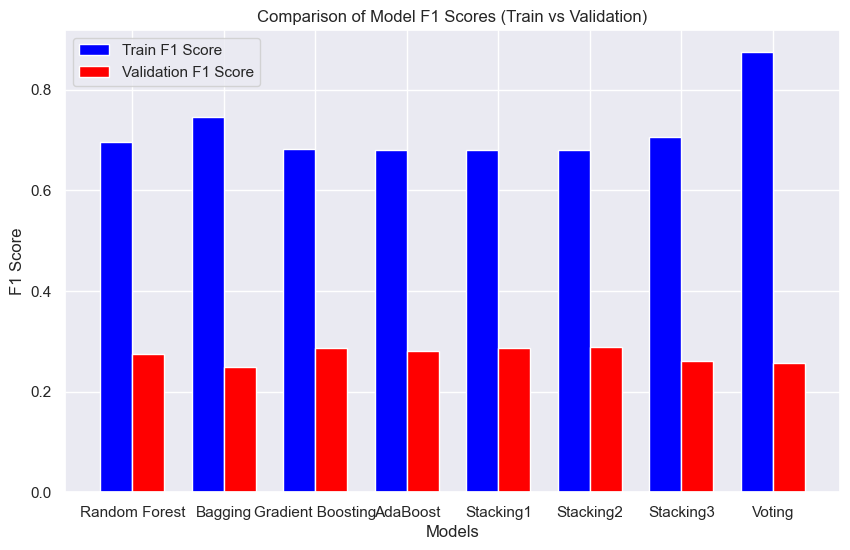

In [154]:
import matplotlib.pyplot as plt

# F1 scores for training and validation sets
train_f1_scores = [f1_train1, f1_train_bagging, f1_train_boosting, f1_train, f1_train2, f1_train3, f1_train4, f1_train5]
val_f1_scores = [f1_val1, f1_val_bagging, f1_val_boosting, f1_val_ada, f1_val2, f1_val3, f1_val4, f1_val5]
model_names = ["Random Forest", "Bagging", "Gradient Boosting", "AdaBoost", "Stacking1", "Stacking2", "Stacking3", "Voting"]
print("Training F1:", train_f1_scores)
print("Validation F1:", val_f1_scores)

# Plotting
x = range(len(model_names))
bar_width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x, train_f1_scores, width=bar_width, label='Train F1 Score', color='blue')
plt.bar([i + bar_width for i in x], val_f1_scores, width=bar_width, label='Validation F1 Score', color='red')

plt.xlabel('Models')
plt.ylabel('F1 Score')
plt.title('Comparison of Model F1 Scores (Train vs Validation)')
plt.xticks([i + bar_width / 2 for i in x], model_names)
plt.legend()

plt.show()


| Model               |  Accuracy Train | Accuracy Validation | F1 Train          | F1 Val             |
|---------------------|---------------------|---------------------|-------------------|--------------------|
| Logistic Regression | 0.6436610911364702  | 0.7784250421111735  | 0.6044251626898048 | 0.25100830367734284|
| Naive Bayes         | 0.5949663904955448  | 0.8333099382369455  | 0.4406303972366149 | 0.2101762554040572 |
| KNN Classifier      | 0.9997655150851962   | 0.6397389107243122  | 0.9997654600891251 | 0.20848111025443333|
| MLP Classifier      | 0.6719556041894638  | 0.7526670409882089  | 0.6793490717396286 | 0.2796402289452167|
| Decision Tree       | 0.6632015007034547  | 0.8150617630544638  | 0.6549763792137079 | 0.25962348974431015|
| Random Forest       | 0.6922776301391277 | 0.75414093206064    | 0.6967105769971498 | 0.27519139250982827|
| Bagging Classifier  | 0.7596529623260904  | 0.7077484559236384  | 0.7463917525773196 | 0.24972972972972973|
| Gradient Boosting   | 0.6778958886978271  | 0.764528354856822   | 0.6815547484738428 | 0.2866255581543696 |
| AdaBoosting         | 0.6735969985930905  | 0.7554042672655812  | 0.6794104099493321 | 0.2798098780739822 |
| Stacking1           | 0.6775050805064874  | 0.76614261650758    | 0.68015503875969   | 0.28650963597430407|
| Stacking2           | 0.6800062529310614  | 0.7659320606400898  | 0.6807050382155669 | 0.2878496690155883 |
| Stacking 3          | 0.7056432702829452  | 0.7253649635036497  | 0.7049514258853025 | 0.26127996979422313|
| Voting Classifier   | 0.8587619196498358  | 0.6002947782144863  | 0.8741380511248867 | 0.2575935340894277 |


## 11.7 All ROC Curves

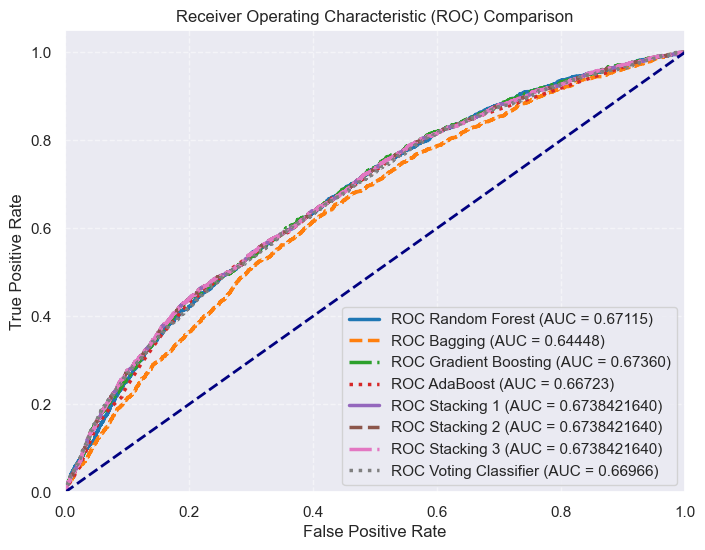

In [155]:
plt.figure(figsize=(8, 6))

plt.plot(fpr_rf, tpr_rf, color='#1f77b4', lw=2.5, linestyle='-', label=f'ROC Random Forest (AUC = {auc_rf:.5})')
plt.plot(fpr_bagging, tpr_bagging, color='#ff7f0e', lw=2.5, linestyle='--', label=f'ROC Bagging (AUC = {auc_bagging:.5f})')
plt.plot(fpr_boosting, tpr_boosting, color='#2ca02c', lw=2.5, linestyle='-.', label=f'ROC Gradient Boosting (AUC = {auc_boosting:.5f})')
plt.plot(fpr_ada, tpr_ada, color='#d62728', lw=2.5, linestyle=':', label=f'ROC AdaBoost (AUC = {auc_ada:.5f})')
plt.plot(fpr_stacking, tpr_stacking, color='#9467bd', lw=2.5, linestyle='-', label=f'ROC Stacking 1 (AUC = {auc_stacking:.10f})')
plt.plot(fpr_stacking2, tpr_stacking2, color='#8c564b', lw=2.5, linestyle='--', label=f'ROC Stacking 2 (AUC = {auc_stacking2:.10f})')
plt.plot(fpr_stacking3, tpr_stacking3, color='#e377c2', lw=2.5, linestyle='-.', label=f'ROC Stacking 3 (AUC = {auc_stacking3:.10f})')
plt.plot(fpr_ensemble, tpr_ensemble, color='#7f7f7f', lw=2.5, linestyle=':', label=f'ROC Voting Classifier (AUC = {auc_ensemble:.5f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Comparison')
plt.legend(loc="lower right")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


# 11.Kaggle submition

In [156]:
def create_test_csv(model, test_data, X_train):
    
    data_pred = model.predict(test_data)
    data_encounter = test['encounter_id'].to_numpy()
    arr = np.asarray([ data_encounter, data_pred ]).T
    pd.DataFrame(arr).to_csv('Group44_version07.csv')

In [157]:
create_test_csv(stacking2,test9_fs, X_undersampled_fs)